Решить задачу object detection при помощи SSD на датасете https://github.com/Shenggan/BCCD_Dataset 
- Реализацию SSD можно посмотреть тут https://github.com/sgrvinod/a-PyTorch-Tutorial-to-Object-Detection 
- Статья по SSD https://d2l.ai/chapter_computer-vision/ssd.html 

# 1. Модель FasterRCNN 

### 1.1 Импорт библиотек

In [ ]:
import os  # Для работы с файловой системой
import numpy as np  # Для численных операций
import torch  # Основной фреймворк для глубокого обучения
import torchvision  # Библиотека для компьютерного зрения
from torchvision.models.detection import FasterRCNN  # Модель детекции объектов
from torchvision.models.detection.rpn import AnchorGenerator  # Генератор якорей для RPN
from torchvision.transforms import functional as F  # Функциональные преобразования изображений
from PIL import Image  # Для работы с изображениями
import matplotlib.pyplot as plt  # Для визуализации
import matplotlib.patches as patches  # Для отрисовки bounding boxes
import xml.etree.ElementTree as ET  # Для парсинга XML аннотаций
from torch.utils.data import Dataset, DataLoader  # Для создания датасетов и загрузчиков
import warnings  # Для управления предупреждениями
from torchvision.ops import box_iou  # Для расчета IoU между боксами



### 1.2 Определяем классы

In [ ]:
# Отключаем предупреждения для удобства вывода
warnings.filterwarnings("ignore")

# Определение классов объектов для детекции
CLASSES = {
    'RBC': 1,    # Красные кровяные тельца (эритроциты)
    'WBC': 2,    # Белые кровяные тельца (лейкоциты)
    'Platelets': 3  # Тромбоциты
}

### 1.3 Кастомный датасет для загрузки данных BCCD

In [ ]:
class BCCDDataset(Dataset):
        
    def __init__(self, root, transforms=None, split='train'):
        """
        Инициализация датасета.
        
        Параметры:
            root (str): Путь к корневой директории датасета
            transforms: Трансформации для применения к изображениям
            split (str): Тип выборки ('train', 'val', 'test')
        """
        self.root = root
        self.transforms = transforms
        self.imgs = []  # Список путей к изображениям
        self.annotations = []  # Список аннотаций
        
        # Загрузка списка изображений для выбранной выборки
        with open(os.path.join(root, 'ImageSets', 'Main', f'{split}.txt'), 'r') as f:
            img_names = f.read().splitlines()
        
        # Обработка каждого изображения и его аннотаций
        for img_name in img_names:
            img_path = os.path.join(root, 'JPEGImages', img_name + '.jpg')
            annotation_path = os.path.join(root, 'Annotations', img_name + '.xml')
            
            # Парсинг XML файла с аннотациями
            tree = ET.parse(annotation_path)
            root_xml = tree.getroot()
            
            boxes = []  # Список bounding boxes
            labels = []  # Список меток классов
            
            # Извлечение информации о каждом объекте на изображении
            for member in root_xml.findall('object'):
                class_name = member.find('name').text
                if class_name not in CLASSES:  # Пропускаем классы не из нашего списка
                    continue
                
                # Получаем метку класса и координаты bounding box
                label = CLASSES[class_name]
                xmin = max(0, int(float(member.find('bndbox').find('xmin').text)))
                ymin = max(0, int(float(member.find('bndbox').find('ymin').text)))
                xmax = max(0, int(float(member.find('bndbox').find('xmax').text)))
                ymax = max(0, int(float(member.find('bndbox').find('ymax').text)))
                
                # Проверка на валидность bounding box
                if xmin >= xmax or ymin >= ymax:
                    print(f"Warning: Skipping invalid box {[xmin, ymin, xmax, ymax]} in {img_name}")
                    continue
                
                boxes.append([xmin, ymin, xmax, ymax])
                labels.append(label)
            
            # Добавляем только изображения с валидными аннотациями
            if len(boxes) > 0:
                self.imgs.append(img_path)
                self.annotations.append({
                    'boxes': torch.as_tensor(boxes, dtype=torch.float32),
                    'labels': torch.as_tensor(labels, dtype=torch.int64)
                })
            else:
                print(f"Warning: No valid boxes in {img_name}, skipping")

    def __getitem__(self, idx):
        """Загрузка и возврат одного элемента датасета по индексу."""
        img_path = self.imgs[idx]
        img = Image.open(img_path).convert("RGB")  # Открываем изображение в RGB формате
        target = self.annotations[idx]  # Получаем соответствующие аннотации
        
        # Применяем трансформации если они заданы
        if self.transforms is not None:
            img = self.transforms(img)
        
        return img, target

    def __len__(self):
        """Возвращает количество элементов в датасете."""
        return len(self.imgs)


### 1.4 Создаем модель Faster R-CNN с MobileNetV2 в качестве backbone.

In [ ]:
def get_model(num_classes):
    """
       
    Параметры:
        num_classes (int): Количество классов для детекции (включая фоновый класс)
    
    Возвращает:
        model: Инициализированная модель Faster R-CNN
    """
    # Загружаем предобученный MobileNetV2 и используем его features
    backbone = torchvision.models.mobilenet_v2(pretrained=True).features
    backbone.out_channels = 1280  # Устанавливаем количество выходных каналов
    
    # Создаем генератор якорей с заданными размерами и соотношениями сторон
    anchor_generator = AnchorGenerator(
        sizes=((32, 64, 128, 256, 512),),  # Размеры якорей
        aspect_ratios=((0.5, 1.0, 2.0),))  # Соотношения сторон
    
    # Инициализируем ROI Pooling слой
    roi_pooler = torchvision.ops.MultiScaleRoIAlign(
        featmap_names=['0'],  # Используем только один уровень feature map
        output_size=7,  # Размер выхода
        sampling_ratio=2)  # Коэффициент семплирования
    
    # Собираем модель Faster R-CNN
    model = FasterRCNN(
        backbone,
        num_classes=num_classes,
        rpn_anchor_generator=anchor_generator,
        box_roi_pool=roi_pooler)
    
    return model

### 1.5 Функция для объединения элементов батча

In [ ]:
def collate_fn(batch):
    return tuple(zip(*batch))

### 1.6 Вычисление метрик качества детекции: precision, recall, F1, mAP.

In [ ]:
def calculate_metrics(predictions, targets, iou_threshold=0.5):
    """
        
    Параметры:
        predictions: Предсказания модели
        targets: Истинные разметки
        iou_threshold: Порог IoU для определения true positive
    
    Возвращает:
        Словарь с вычисленными метриками
    """
    # Инициализация счетчиков
    true_positives = 0
    false_positives = 0
    false_negatives = 0
    ap_scores = []  # Список AP для каждого класса
    
    # Словарь для хранения метрик по классам
    class_metrics = {class_id: {'scores': [], 'tp': [], 'gt_count': 0} 
                    for class_id in CLASSES.values()}
    
    # Обрабатываем каждое изображение в батче
    for pred, target in zip(predictions, targets):
        # Преобразуем тензоры в numpy массивы
        pred_boxes = pred['boxes'].cpu().numpy()
        pred_labels = pred['labels'].cpu().numpy()
        pred_scores = pred['scores'].cpu().numpy()
        
        target_boxes = target['boxes'].cpu().numpy()
        target_labels = target['labels'].cpu().numpy()
        
        # Фильтруем предсказания по confidence score (0.5)
        keep = pred_scores >= 0.5
        pred_boxes = pred_boxes[keep]
        pred_labels = pred_labels[keep]
        pred_scores = pred_scores[keep]
        
        # Считаем количество объектов каждого класса в ground truth
        for class_id in np.unique(target_labels):
            class_metrics[class_id]['gt_count'] += np.sum(target_labels == class_id)
        
        # Если нет предсказаний - все объекты false negatives
        if len(pred_boxes) == 0:
            false_negatives += len(target_boxes)
            continue
            
        # Если нет ground truth - все предсказания false positives
        if len(target_boxes) == 0:
            false_positives += len(pred_boxes)
            continue
            
        # Вычисляем матрицу IoU между предсказаниями и ground truth
        iou_matrix = box_iou(torch.tensor(pred_boxes), torch.tensor(target_boxes)).numpy()
        
        matched_gt = set()  # Множество для отслеживания сопоставленных GT
        
        # Обрабатываем каждое предсказание
        for i, (box, label, score) in enumerate(zip(pred_boxes, pred_labels, pred_scores)):
            best_match = np.argmax(iou_matrix[i])  # Индекс GT с максимальным IoU
            best_iou = iou_matrix[i, best_match]  # Значение IoU
            
            # Проверяем условия для true positive:
            # 1. IoU > порога
            # 2. Классы совпадают
            # 3. GT еще не сопоставлен
            if (best_iou >= iou_threshold and 
                label == target_labels[best_match] and 
                best_match not in matched_gt):
                true_positives += 1
                matched_gt.add(best_match)
                class_metrics[label]['scores'].append(score)
                class_metrics[label]['tp'].append(1)
            else:
                false_positives += 1
                class_metrics[label]['scores'].append(score)
                class_metrics[label]['tp'].append(0)
        
        # Несопоставленные GT считаем как false negatives
        false_negatives += len(target_boxes) - len(matched_gt)
    
    # Вычисляем Average Precision для каждого класса
    for class_id, metrics in class_metrics.items():
        if metrics['gt_count'] == 0 or len(metrics['scores']) == 0:
            continue
            
        # Сортируем предсказания по confidence score
        sorted_indices = np.argsort(-np.array(metrics['scores']))
        tp = np.array(metrics['tp'])[sorted_indices]
        
        # Вычисляем кумулятивные суммы TP и FP
        cum_tp = np.cumsum(tp)
        cum_fp = np.cumsum(1 - tp)
        
        # Вычисляем precision и recall
        precision = cum_tp / (cum_tp + cum_fp + 1e-6)
        recall = cum_tp / (metrics['gt_count'] + 1e-6)
        
        # Вычисляем AP по 11 точкам
        ap = 0
        for t in np.linspace(0, 1, 11):
            mask = recall >= t
            if np.any(mask):
                ap += np.max(precision[mask]) / 11
                
        ap_scores.append(ap)
    
    # Вычисляем общие метрики
    precision = true_positives / (true_positives + false_positives + 1e-6)
    recall = true_positives / (true_positives + false_negatives + 1e-6)
    f1 = 2 * (precision * recall) / (precision + recall + 1e-6)
    mean_ap = np.mean(ap_scores) if ap_scores else 0
    
    return {
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'mAP': mean_ap,
        'true_positives': true_positives,
        'false_positives': false_positives,
        'false_negatives': false_negatives
    }

### 1.7 Метод для одной эпохи обучения модели

In [ ]:
def train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=10):
    """
        
    Параметры:
        model: Модель для обучения
        optimizer: Оптимизатор
        data_loader: Загрузчик данных
        device: Устройство (CPU/GPU)
        epoch: Номер текущей эпохи
        print_freq: Частота вывода информации о процессе
    
    Возвращает:
        Среднее значение функции потерь за эпоху
    """
    model.train()
    total_loss = 0
    
    for batch_idx, (images, targets) in enumerate(data_loader):
        # Переносим изображения и аннотации на выбранное устройство
        images = [F.to_tensor(img).to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        
        optimizer.zero_grad()  # Обнуляем градиенты
        
        # Прямой проход и вычисление потерь
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        
        # Обратный проход и обновление весов
        losses.backward()
        optimizer.step()
        
        total_loss += losses.item()
        
        # Периодический вывод информации о процессе обучения
        if batch_idx % print_freq == 0:
            avg_loss = total_loss / (batch_idx + 1)
            print(f'Epoch [{epoch}], Batch [{batch_idx}/{len(data_loader)}], Loss: {avg_loss:.4f}')
    
    return total_loss / len(data_loader)

### 1.8 Оценка модели на валидационной или тестовой выборке

In [ ]:
def evaluate_model(model, data_loader, device):
    """
        
    Параметры:
        model: Модель для оценки
        data_loader: Загрузчик данных
        device: Устройство (CPU/GPU)
    
    Возвращает:
        Словарь с вычисленными метриками
    """
    model.eval()  # Переводим модель в режим оценки
    all_metrics = []  # Для хранения метрик по всем батчам
    
    with torch.no_grad():  # Отключаем вычисление градиентов
        for images, targets in data_loader:
            # Переносим данные на устройство
            images = [F.to_tensor(img).to(device) for img in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            
            # Получаем предсказания модели
            predictions = model(images)
            # Вычисляем метрики для текущего батча
            batch_metrics = calculate_metrics(predictions, targets)
            all_metrics.append(batch_metrics)
    
    # Агрегируем метрики по всем батчам
    avg_metrics = {
        'precision': np.mean([m['precision'] for m in all_metrics]),
        'recall': np.mean([m['recall'] for m in all_metrics]),
        'f1': np.mean([m['f1'] for m in all_metrics]),
        'mAP': np.mean([m['mAP'] for m in all_metrics]),
        'true_positives': sum(m['true_positives'] for m in all_metrics),
        'false_positives': sum(m['false_positives'] for m in all_metrics),
        'false_negatives': sum(m['false_negatives'] for m in all_metrics)
    }
    
    # Выводим результаты оценки
    print("\nEvaluation Metrics:")
    print(f"Precision: {avg_metrics['precision']:.4f}")
    print(f"Recall: {avg_metrics['recall']:.4f}")
    print(f"F1 Score: {avg_metrics['f1']:.4f}")
    print(f"mAP: {avg_metrics['mAP']:.4f}")
    print(f"True Positives: {avg_metrics['true_positives']}")
    print(f"False Positives: {avg_metrics['false_positives']}")
    print(f"False Negatives: {avg_metrics['false_negatives']}")
    
    return avg_metrics

### 1.9 Визуализация предсказаний модели на нескольких случайных изображениях

In [ ]:
def visualize_predictions(model, dataset, device, num_images=3):
    """
        
    Параметры:
        model: Обученная модель
        dataset: Датасет для визуализации
        device: Устройство (CPU/GPU)
        num_images: Количество изображений для визуализации
    """
    model.eval()  # Режим оценки
    # Выбираем случайные изображения
    indices = np.random.choice(len(dataset), num_images)
    
    for idx in indices:
        image, target = dataset[idx]  # Получаем изображение и аннотации
        img_tensor = F.to_tensor(image).to(device)  # Преобразуем в тензор
        
        with torch.no_grad():  # Без вычисления градиентов
            prediction = model([img_tensor])  # Получаем предсказания
        
        # Подготовка изображения для отображения
        image = np.array(image)
        fig, ax = plt.subplots(1, figsize=(12, 8))
        ax.imshow(image)
        
        # Отрисовка ground truth (зеленые прямоугольники)
        for box, label in zip(target['boxes'], target['labels']):
            xmin, ymin, xmax, ymax = box.cpu().numpy()
            rect = patches.Rectangle(
                (xmin, ymin), xmax-xmin, ymax-ymin,
                linewidth=1, edgecolor='g', facecolor='none')
            ax.add_patch(rect)
            ax.text(xmin, ymin, f'GT: {list(CLASSES.keys())[label-1]}', 
                   color='g', fontsize=8, bbox=dict(facecolor='white', alpha=0.7))
        
        # Отрисовка предсказаний (красные прямоугольники)
        for box, label, score in zip(prediction[0]['boxes'], 
                                   prediction[0]['labels'], 
                                   prediction[0]['scores']):
            if score > 0.5:  # Фильтр по confidence score
                xmin, ymin, xmax, ymax = box.cpu().numpy()
                rect = patches.Rectangle(
                    (xmin, ymin), xmax-xmin, ymax-ymin,
                    linewidth=1, edgecolor='r', facecolor='none')
                ax.add_patch(rect)
                ax.text(xmin, ymin, 
                       f'Pred: {list(CLASSES.keys())[label-1]} {score:.2f}', 
                       color='r', fontsize=8, bbox=dict(facecolor='white', alpha=0.7))
        
        plt.axis('off')  # Отключаем оси
        plt.tight_layout()  # Оптимизируем расположение
        plt.show()  # Показываем изображение

### 1.10 Визуализация метрик обучения и валидации.

In [ ]:
def plot_metrics(train_loss_history, val_metrics_history):
    """
        
    Параметры:
        train_loss_history: История значений функции потерь на обучении
        val_metrics_history: История метрик на валидации
    """
    plt.figure(figsize=(15, 12))  # Создаем фигуру
    
    # 1. График функции потерь на обучении
    plt.subplot(2, 2, 1)
    plt.plot(train_loss_history, label='Train Loss')
    plt.title('Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    
    # 2. График Precision на валидации
    plt.subplot(2, 2, 2)
    plt.plot([m['precision'] for m in val_metrics_history], 'b-', label='Precision')
    plt.title('Validation Precision')
    plt.xlabel('Epoch')
    plt.ylabel('Precision')
    plt.legend()
    
    # 3. График Recall на валидации
    plt.subplot(2, 2, 3)
    plt.plot([m['recall'] for m in val_metrics_history], 'g-', label='Recall')
    plt.title('Validation Recall')
    plt.xlabel('Epoch')
    plt.ylabel('Recall')
    plt.legend()
    
    # 4. Графики F1 и mAP на валидации
    plt.subplot(2, 2, 4)
    plt.plot([m['f1'] for m in val_metrics_history], 'r-', label='F1 Score')
    plt.plot([m['mAP'] for m in val_metrics_history], 'm-', label='mAP')
    plt.title('F1 Score and mAP')
    plt.xlabel('Epoch')
    plt.ylabel('Score')
    plt.legend()
    
    plt.tight_layout()  # Оптимизируем расположение
    plt.savefig('training_metrics.png')  # Сохраняем графики
    plt.show()  # Показываем графики

### 1.11 Основная функция для запуска обучения и оценки модели

Using device: cpu

Epoch 1/10
Epoch [0], Batch [0/52], Loss: 2.4172
Epoch [0], Batch [10/52], Loss: 1.8652
Epoch [0], Batch [20/52], Loss: 1.7376
Epoch [0], Batch [30/52], Loss: 1.7024
Epoch [0], Batch [40/52], Loss: 1.6714
Epoch [0], Batch [50/52], Loss: 1.6207
Train Loss: 1.6174

Evaluation Metrics:
Precision: 0.7595
Recall: 0.3254
F1 Score: 0.4362
mAP: 0.3436
True Positives: 350
False Positives: 111
False Negatives: 787
Saved best model!

Epoch 2/10
Epoch [1], Batch [0/52], Loss: 0.9714
Epoch [1], Batch [10/52], Loss: 1.1733
Epoch [1], Batch [20/52], Loss: 1.1476
Epoch [1], Batch [30/52], Loss: 1.1321
Epoch [1], Batch [40/52], Loss: 1.1097
Epoch [1], Batch [50/52], Loss: 1.0954
Train Loss: 1.0840

Evaluation Metrics:
Precision: 0.8618
Recall: 0.6154
F1 Score: 0.6949
mAP: 0.6777
True Positives: 667
False Positives: 118
False Negatives: 470
Saved best model!

Epoch 3/10
Epoch [2], Batch [0/52], Loss: 1.1240
Epoch [2], Batch [10/52], Loss: 1.0276
Epoch [2], Batch [20/52], Loss: 1.0028


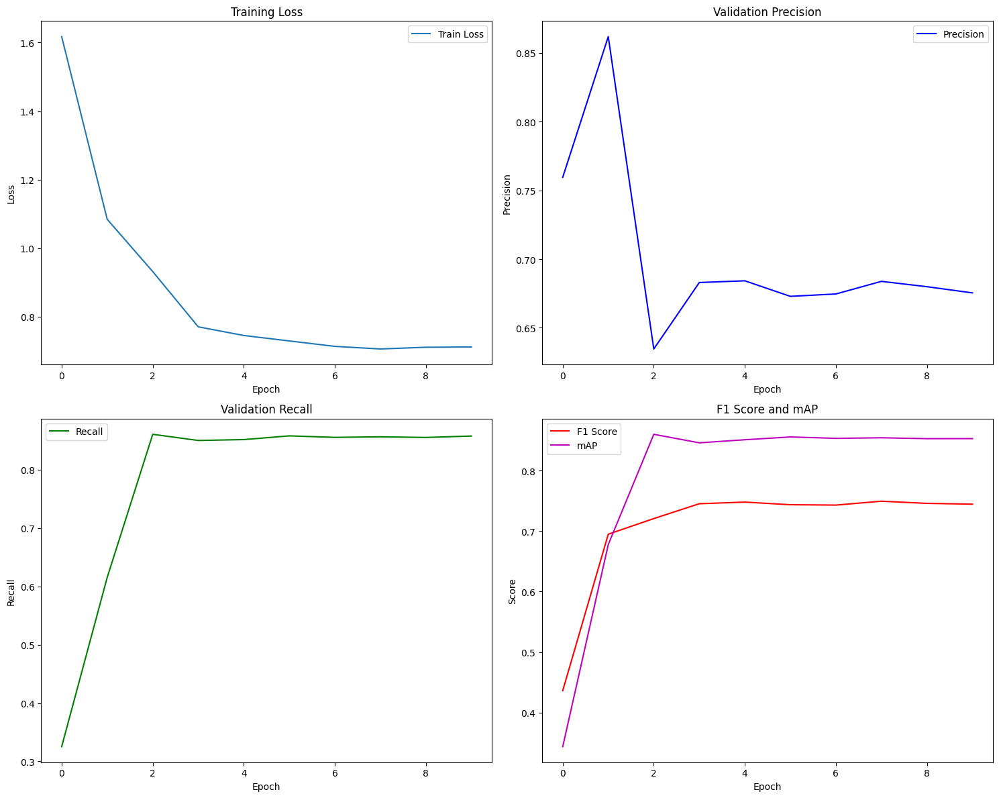


Final Evaluation on Test Set:

Evaluation Metrics:
Precision: 0.6963
Recall: 0.8347
F1 Score: 0.7476
mAP: 0.8406
True Positives: 779
False Positives: 353
False Negatives: 166

Visualizing predictions on test set...


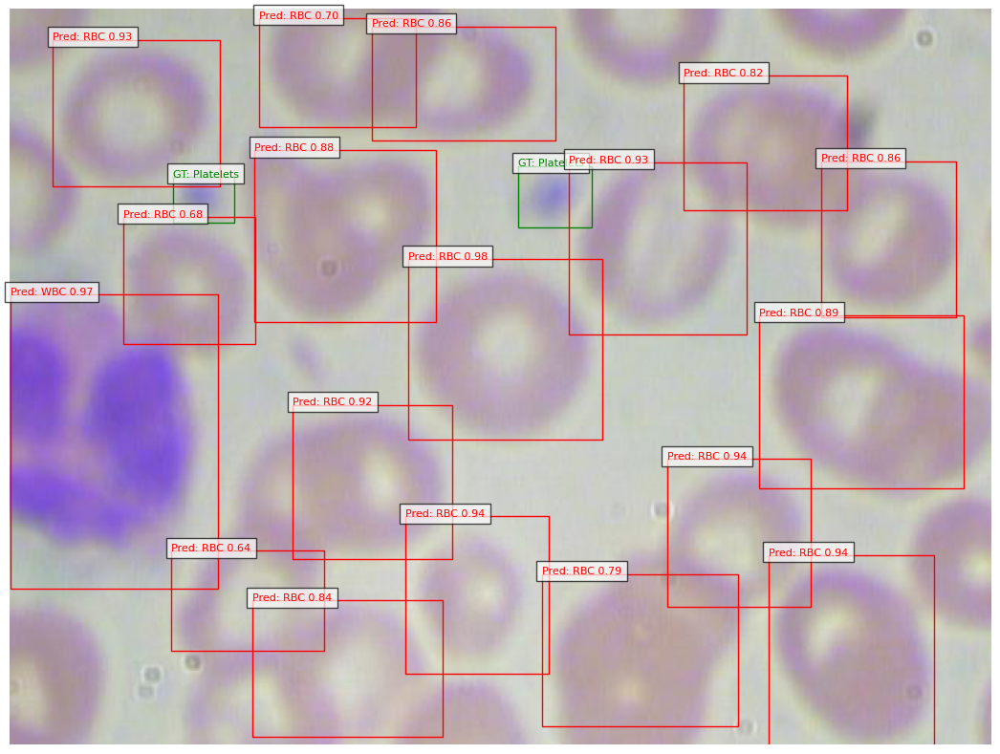

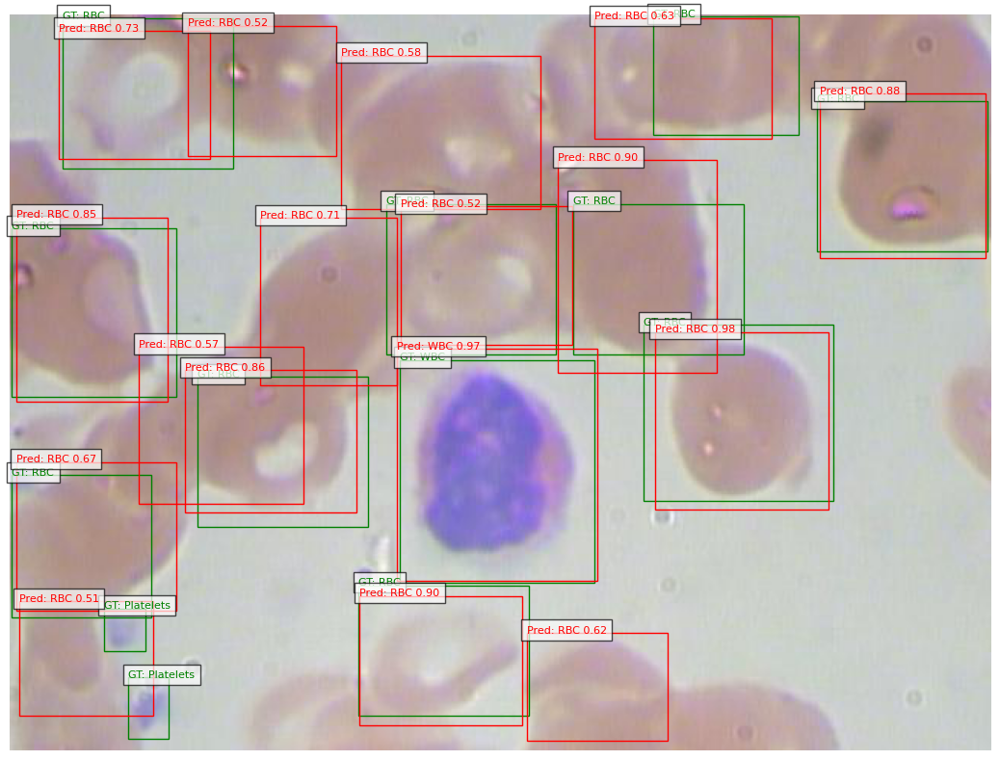

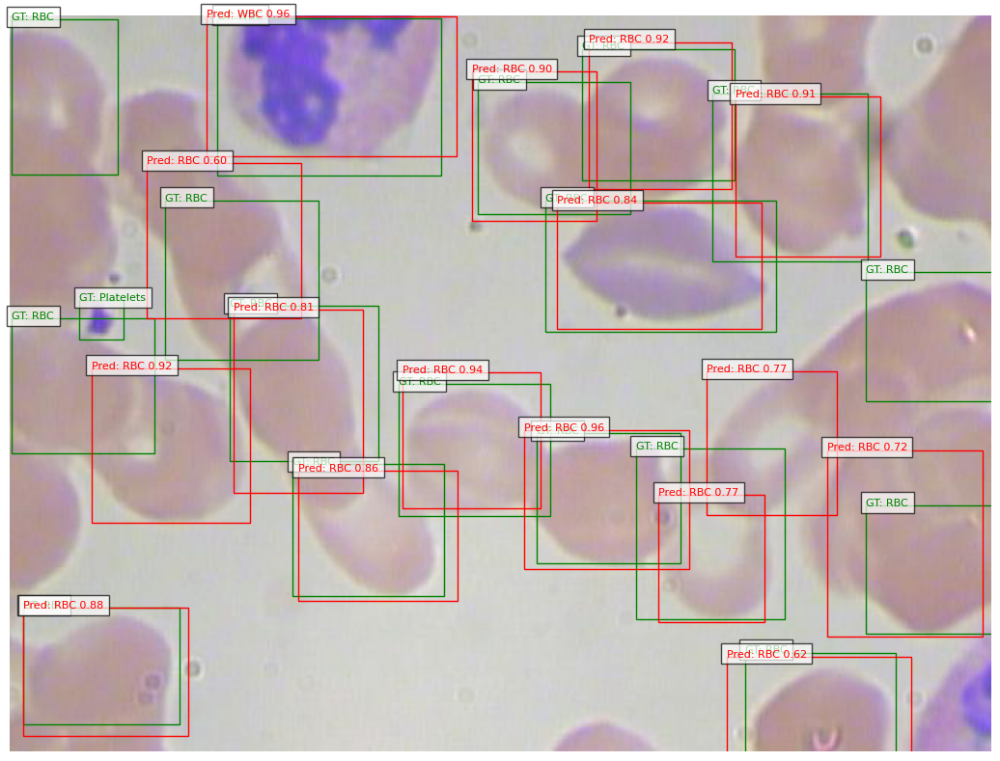

In [83]:
def main():
    
    # Определяем устройство (GPU если доступно, иначе CPU)
    device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
    print(f"Using device: {device}")
    
    # Путь к датасету
    dataset_path = "BCCD_Dataset/BCCD"
    
    # Создаем датасеты для обучения, валидации и тестирования
    train_dataset = BCCDDataset(dataset_path, split='train')
    val_dataset = BCCDDataset(dataset_path, split='val')
    test_dataset = BCCDDataset(dataset_path, split='test')
    
    # Создаем загрузчики данных
    train_loader = DataLoader(
        train_dataset, batch_size=4, shuffle=True, 
        collate_fn=collate_fn, num_workers=4, pin_memory=True)
    val_loader = DataLoader(
        val_dataset, batch_size=4, shuffle=False, 
        collate_fn=collate_fn, num_workers=4, pin_memory=True)
    test_loader = DataLoader(
        test_dataset, batch_size=4, shuffle=False, 
        collate_fn=collate_fn, num_workers=4, pin_memory=True)
    
    # Количество классов (+1 для фонового класса)
    num_classes = len(CLASSES) + 1
    # Создаем и переносим модель на устройство
    model = get_model(num_classes).to(device)
    
    # Настраиваем оптимизатор и scheduler
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)
    lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)
    
    num_epochs = 10  # Количество эпох обучения
    best_f1 = 0.0  # Для сохранения лучшей модели
    
    # Для хранения истории метрик
    train_loss_history = []
    val_metrics_history = []
    
    # Цикл обучения
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch + 1}/{num_epochs}")
        
        # Одна эпоха обучения
        train_loss = train_one_epoch(model, optimizer, train_loader, device, epoch)
        train_loss_history.append(train_loss)
        print(f"Train Loss: {train_loss:.4f}")
        
        # Оценка на валидации
        val_metrics = evaluate_model(model, val_loader, device)
        val_metrics_history.append(val_metrics)
        
        # Сохраняем модель если улучшился F1-score
        if val_metrics['f1'] > best_f1:
            best_f1 = val_metrics['f1']
            torch.save(model.state_dict(), 'best_model.pth')
            print("Saved best model!")
        
        lr_scheduler.step()  # Обновляем learning rate
    
    # Визуализация метрик обучения
    plot_metrics(train_loss_history, val_metrics_history)
    
    # Финальная оценка на тестовом наборе
    print("\nFinal Evaluation on Test Set:")
    model.load_state_dict(torch.load('best_model.pth'))  # Загружаем лучшую модель
    test_metrics = evaluate_model(model, test_loader, device)
    
    # Визуализация примеров предсказаний
    print("\nVisualizing predictions on test set...")
    visualize_predictions(model, test_dataset, device, num_images=3)

if __name__ == '__main__':
    main()

### 1.12 Выводы: 

1. Модель показывает адекватное улучшение при обучении: Положительная динамика: снижение ошибки, стабильный прирост Recall/mAP.
2. Конечные результаты на тест-сете: F1-Score: 0.7476, mAP: 0.8406.
3. Значения метрик указывают на успешное обучение для данной задачи, именно в предметной области (анализ изображений крови).
4. Однако: модель вышла на плато в F1-Score раньше конца обучения (после 5-й эпохи), требуется более глубокий fine-tuning гиперпараметров, таких как learning rate или weight decay, либо анализ недостатков данных.

# 2. Модель SSD300 с предобученным бэкбоном VGG16 

### 2.1 Загружаем библиотеки

In [ ]:
import os
import logging
from collections import defaultdict
import xml.etree.ElementTree as ET

import torch
import torchvision
from torchvision.models.detection import ssd300_vgg16
from torchvision.models.detection.ssd import DefaultBoxGenerator  # Используем типичный генератор боксов
from torchvision.ops import box_iou
from torch.utils.data import Dataset, DataLoader
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from tqdm import tqdm
import seaborn as sns
import pandas as pd  # Перемещено наверх

# Настройка логирования
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# Настройки устройства
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

### 2.2 Класс датасета для детекции на основе BCCD

In [ ]:
class BCCDDataset(Dataset):
    
    def __init__(self, dataset_path: str, image_set='train', transform=None):
        self.dataset_path = dataset_path
        self.image_set = image_set
        self.transform = transform

        # Классы: индекс 0 используется для background
        self.classes = ['__background__', 'RBC', 'WBC', 'Platelets']
        self.class_to_idx = {cls: i for i, cls in enumerate(self.classes)}

        imageset_file = os.path.join(dataset_path, 'ImageSets', 'Main', f'{image_set}.txt')
        with open(imageset_file, 'r') as f:
            image_names = [line.strip() for line in f.readlines() if line.strip()]

        self.image_paths = []
        self.annotation_paths = []
        for img_name in image_names:
            img_path = os.path.join(dataset_path, 'JPEGImages', img_name + '.jpg')
            ann_path = os.path.join(dataset_path, 'Annotations', img_name + '.xml')
            if os.path.exists(img_path) and os.path.exists(ann_path):
                self.image_paths.append(img_path)
                self.annotation_paths.append(ann_path)
            else:
                logging.warning(f"Пропущены файлы: {img_path} или {ann_path}")

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx: int):
        # Загрузка изображения
        img = Image.open(self.image_paths[idx]).convert("RGB")
        tree = ET.parse(self.annotation_paths[idx])
        root = tree.getroot()

        # Получаем размеры изображения (не обязательно, но можно использовать для нормализации боксов)
        width = float(root.find('size/width').text)
        height = float(root.find('size/height').text)

        boxes = []
        labels = []

        for obj in root.iter('object'):
            cls_name = obj.find('name').text
            if cls_name not in self.class_to_idx:
                logging.warning(f"Класс {cls_name} не найден в словаре классов.")
                continue

            bndbox = obj.find('bndbox')
            xmin = float(bndbox.find('xmin').text)
            ymin = float(bndbox.find('ymin').text)
            xmax = float(bndbox.find('xmax').text)
            ymax = float(bndbox.find('ymax').text)

            # Проверка валидности bounding box
            if xmin >= xmax or ymin >= ymax:
                logging.warning(f"Неверный box в {self.annotation_paths[idx]}: [{xmin}, {ymin}, {xmax}, {ymax}]")
                continue

            # Добавляем минимальные смещения для очень маленьких боксов
            if (xmax - xmin) < 1.0:
                xmax = xmin + 1.0
            if (ymax - ymin) < 1.0:
                ymax = ymin + 1.0

            boxes.append([xmin, ymin, xmax, ymax])
            labels.append(self.class_to_idx[cls_name])

        # Если в изображении нет валидных боксов
        if not boxes:
            boxes = torch.zeros((0, 4), dtype=torch.float32)
            labels = torch.zeros((0,), dtype=torch.int64)
        else:
            boxes = torch.as_tensor(boxes, dtype=torch.float32)
            labels = torch.as_tensor(labels, dtype=torch.int64)

        target = {
            "boxes": boxes,
            "labels": labels,
            "image_id": torch.tensor([idx]),
            "area": (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]) if boxes.numel() > 0 else torch.tensor([]),
            "iscrowd": torch.zeros((boxes.shape[0],), dtype=torch.int64)
        }

        if self.transform:
            img = self.transform(img)

        return img, target

### 2.3 Рабочие методы 

In [ ]:
def collate_fn(batch):
    """Функция для объединения batch-ов, так как в таргете могут быть разное число объектов."""
    return tuple(zip(*batch))


def create_model(num_classes: int):
    """
    Создаёт модель SSD300 с корректной настройкой генератора якорей.
    Используется pretrained_backbone.
    """
    model = ssd300_vgg16(
        num_classes=num_classes,
        pretrained=False,
        pretrained_backbone=True
    )

    # Обновление генератора якорей
    model.anchor_generator = DefaultBoxGenerator(
        aspect_ratios=[[2], [2, 3], [2, 3], [2, 3], [2], [2]],
        scales=[0.07, 0.15, 0.33, 0.51, 0.69, 0.87, 1.05],
        steps=[8, 16, 32, 64, 100, 300]
    )
    return model.to(device)


def train_one_epoch(model, optimizer, data_loader, device, epoch: int):
    """
    Обучает модель на одной эпохе.
    Возвращает средний лосс за эпоху.
    """
    model.train()
    total_loss = 0
    loss_history = []

    for images, targets in tqdm(data_loader, desc=f"Epoch {epoch}"):
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        curr_loss = losses.item()
        total_loss += curr_loss
        loss_history.append(curr_loss)

    # График обучения за эпоху
    plt.figure(figsize=(10, 5))
    plt.plot(loss_history, label='Batch Loss')
    plt.xlabel('Batch')
    plt.ylabel('Loss')
    plt.title(f'Training Loss During Epoch {epoch}')
    plt.legend()
    plt.grid()
    plt.show()

    return total_loss / len(data_loader)

### 2.4 Визуализация предсказания модели на нескольких изображениях

In [ ]:

def visualize_predictions(model, data_loader, device, num_images=3):
    
    model.eval()
    images_processed = 0
    # Классы без учета background
    class_names = ['RBC', 'WBC', 'Platelets']
    colors = ['r', 'g', 'b']

    with torch.no_grad():
        for images, targets in data_loader:
            if images_processed >= num_images:
                break

            images = [img.to(device) for img in images]
            predictions = model(images)

            for i in range(len(images)):
                if images_processed >= num_images:
                    break

                img_np = images[i].cpu().permute(1, 2, 0).numpy()
                # Нормализация изображения для отображения
                img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min() + 1e-6)

                target = targets[i]
                prediction = predictions[i]

                fig, ax = plt.subplots(1, 2, figsize=(20, 10))

                # Ground Truth
                ax[0].imshow(img_np)
                for box, label in zip(target['boxes'], target['labels']):
                    if label == 0:  # Пропускаем background
                        continue
                    xmin, ymin, xmax, ymax = box
                    rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2,
                                             edgecolor=colors[label - 1], facecolor='none')
                    ax[0].add_patch(rect)
                    ax[0].text(xmin, ymin, class_names[label - 1], color='white', fontsize=12,
                               bbox=dict(facecolor=colors[label - 1], alpha=0.5))
                ax[0].set_title('Ground Truth')
                ax[0].axis('off')

                # Predictions
                ax[1].imshow(img_np)
                for box, label, score in zip(prediction['boxes'], prediction['labels'], prediction['scores']):
                    if label == 0 or score < 0.5:  # Пропускаем низкую достоверность и background
                        continue
                    xmin, ymin, xmax, ymax = box
                    rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2,
                                             edgecolor=colors[label - 1], facecolor='none')
                    ax[1].add_patch(rect)
                    ax[1].text(xmin, ymin, f"{class_names[label - 1]} {score:.2f}", color='white', fontsize=12,
                               bbox=dict(facecolor=colors[label - 1], alpha=0.5))
                ax[1].set_title('Predictions')
                ax[1].axis('off')

                plt.show()
                images_processed += 1

### 2.5 Расчет метрик для каждого класса

In [ ]:
def calculate_metrics(model, data_loader, device, iou_threshold=0.5):
   
    model.eval()
    metrics = defaultdict(lambda: {'tp': 0, 'fp': 0, 'fn': 0})
    class_names = ['RBC', 'WBC', 'Platelets']

    with torch.no_grad():
        for images, targets in tqdm(data_loader, desc="Вычисление метрик"):
            images = [img.to(device) for img in images]
            predictions = model(images)

            for pred, target in zip(predictions, targets):
                gt_boxes = target['boxes'].to(device)
                gt_labels = target['labels'].to(device)

                for cls_idx, cls_name in enumerate(class_names, 1):
                    gt_mask = gt_labels == cls_idx
                    pred_mask = pred['labels'] == cls_idx

                    gt_boxes_cls = gt_boxes[gt_mask]
                    pred_boxes_cls = pred['boxes'][pred_mask]

                    if len(gt_boxes_cls) == 0 and len(pred_boxes_cls) == 0:
                        continue

                    if len(gt_boxes_cls) == 0:
                        metrics[cls_name]['fp'] += len(pred_boxes_cls)
                        continue

                    if len(pred_boxes_cls) == 0:
                        metrics[cls_name]['fn'] += len(gt_boxes_cls)
                        continue

                    iou = box_iou(pred_boxes_cls, gt_boxes_cls)
                    # Для каждого предсказанного бокса находим максимальное IoU
                    max_iou = iou.max(dim=1)[0]

                    tp = (max_iou >= iou_threshold).sum().item()
                    fp = (max_iou < iou_threshold).sum().item()
                    fn = max(0, len(gt_boxes_cls) - tp)

                    metrics[cls_name]['tp'] += tp
                    metrics[cls_name]['fp'] += fp
                    metrics[cls_name]['fn'] += fn

    results = {}
    for cls in class_names:
        tp = metrics[cls]['tp']
        fp = metrics[cls]['fp']
        fn = metrics[cls]['fn']

        precision = tp / (tp + fp) if (tp + fp) > 0 else 0
        recall = tp / (tp + fn) if (tp + fn) > 0 else 0
        f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

        results[cls] = {
            'precision': precision,
            'recall': recall,
            'f1': f1,
            'tp': tp,
            'fp': fp,
            'fn': fn
        }

    visualize_metrics(results)
    return results


### 2.6 Визуализация метрик по классам с помощью столбчатой диаграммы и тепловой карты.

In [ ]:
def visualize_metrics(metrics: dict):
    
    classes = list(metrics.keys())
    precision = [metrics[cls]['precision'] for cls in classes]
    recall = [metrics[cls]['recall'] for cls in classes]
    f1 = [metrics[cls]['f1'] for cls in classes]

    x = np.arange(len(classes))
    width = 0.25

    fig, ax = plt.subplots(figsize=(10, 6))
    rects1 = ax.bar(x - width, precision, width, label='Precision')
    rects2 = ax.bar(x, recall, width, label='Recall')
    rects3 = ax.bar(x + width, f1, width, label='F1 Score')

    ax.set_ylabel('Scores')
    ax.set_title('Metrics by Class')
    ax.set_xticks(x)
    ax.set_xticklabels(classes)
    ax.legend()
    ax.set_ylim(0, 1.1)

    for rect in rects1 + rects2 + rects3:
        height = rect.get_height()
        ax.annotate(f'{height:.2f}',
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),
                    textcoords="offset points",
                    ha='center', va='bottom')

    plt.show()

    # Тепловая карта
    metrics_data = {
        'Class': classes,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1
    }
    plt.figure(figsize=(8, 4))
    sns.heatmap(pd.DataFrame(metrics_data).set_index('Class'),
                annot=True, cmap='YlGnBu', vmin=0, vmax=1,
                fmt='.2f', linewidths=.5)
    plt.title('Metrics Heatmap')
    plt.show()

### 2.7 История обучения в виде графика потерь по эпохам

In [ ]:
def plot_training_history(train_losses):
    """Отображает историю обучения в виде графика потерь по эпохам."""
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label='Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training Loss History')
    plt.legend()
    plt.grid()
    plt.show()

### 2.8 Основная функция для запуска обучения и оценки модели

2025-04-06 11:00:14,684 - INFO - Начало эпохи 0
Epoch 0: 100%|██████████████████████████████████| 52/52 [01:01<00:00,  1.19s/it]


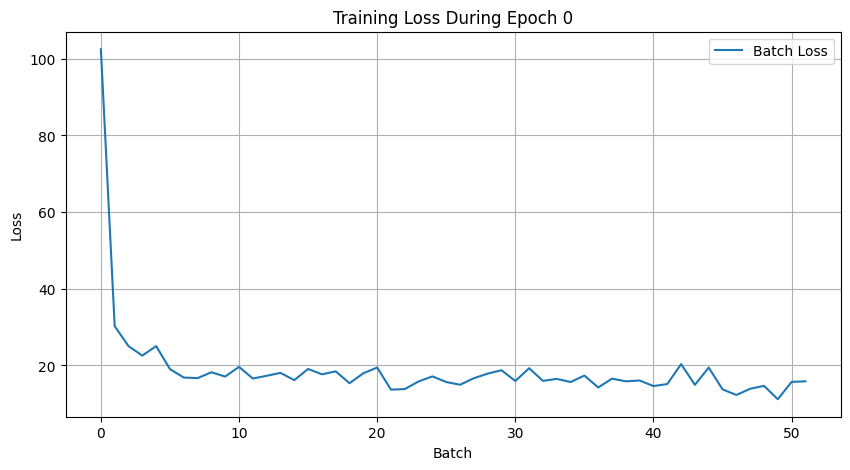

2025-04-06 11:01:16,564 - INFO - Epoch 0: Loss: 18.8204
2025-04-06 11:01:16,565 - INFO - Начало эпохи 1
Epoch 1: 100%|██████████████████████████████████| 52/52 [01:02<00:00,  1.20s/it]


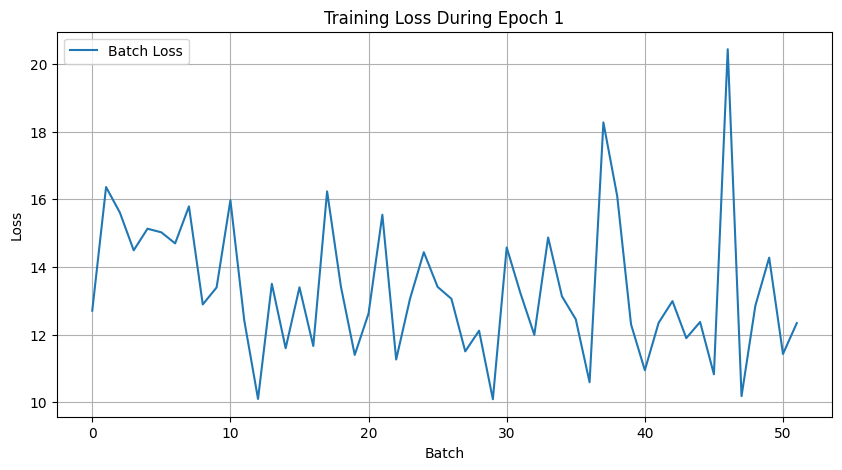

2025-04-06 11:02:18,834 - INFO - Epoch 1: Loss: 13.3352
Вычисление метрик: 100%|████████████████████████| 87/87 [00:12<00:00,  6.77it/s]


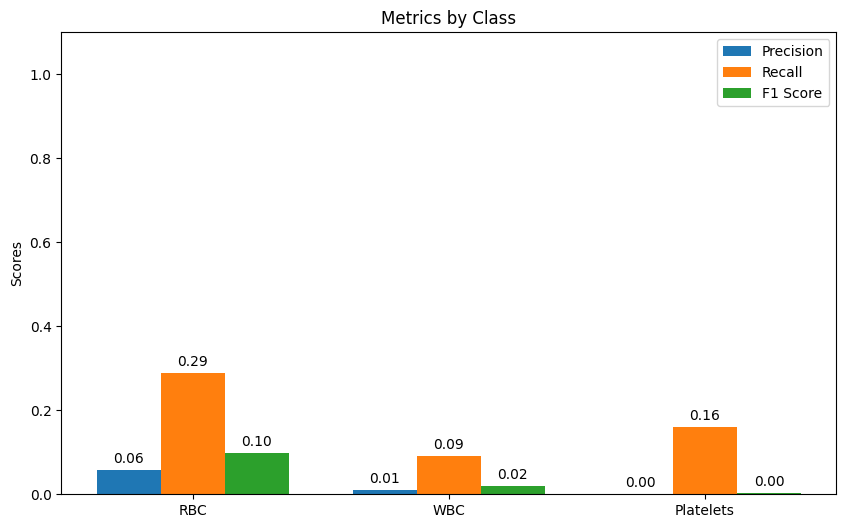

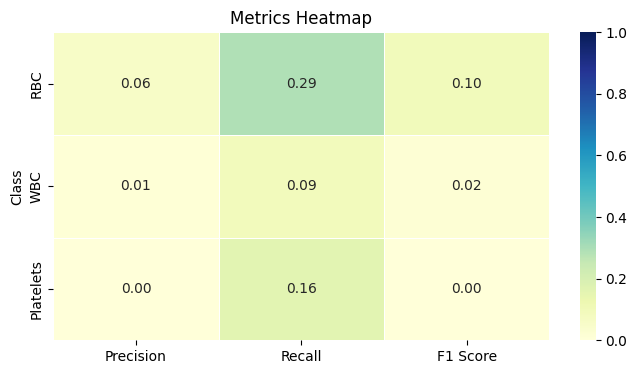

2025-04-06 11:02:31,846 - INFO - Metrics:
2025-04-06 11:02:31,846 - INFO - RBC: Precision=0.058, Recall=0.290, F1=0.097
2025-04-06 11:02:31,846 - INFO - WBC: Precision=0.011, Recall=0.091, F1=0.019
2025-04-06 11:02:31,847 - INFO - Platelets: Precision=0.001, Recall=0.161, F1=0.002


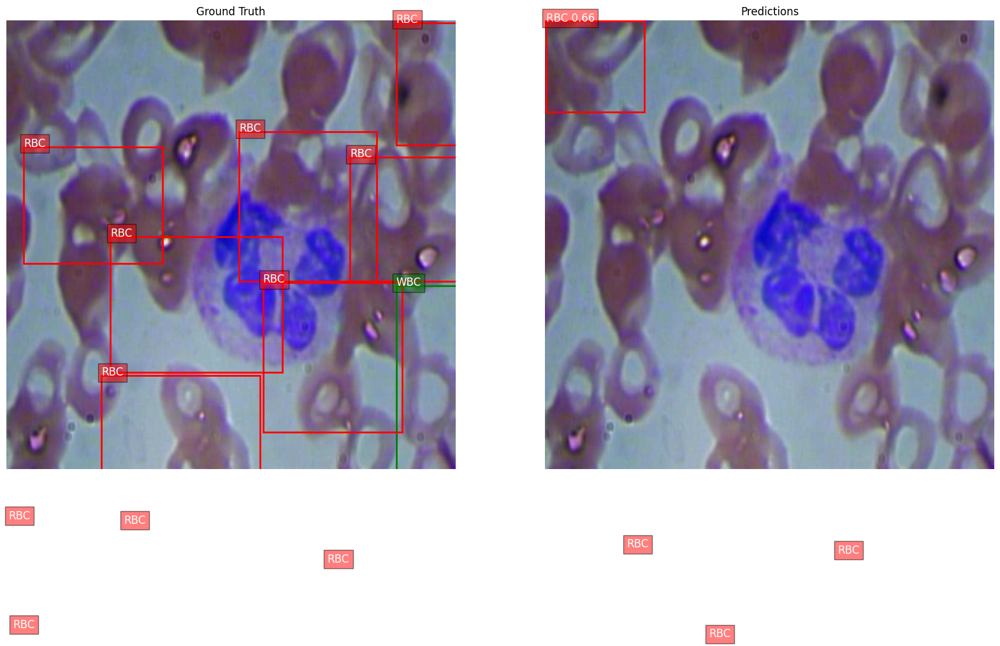

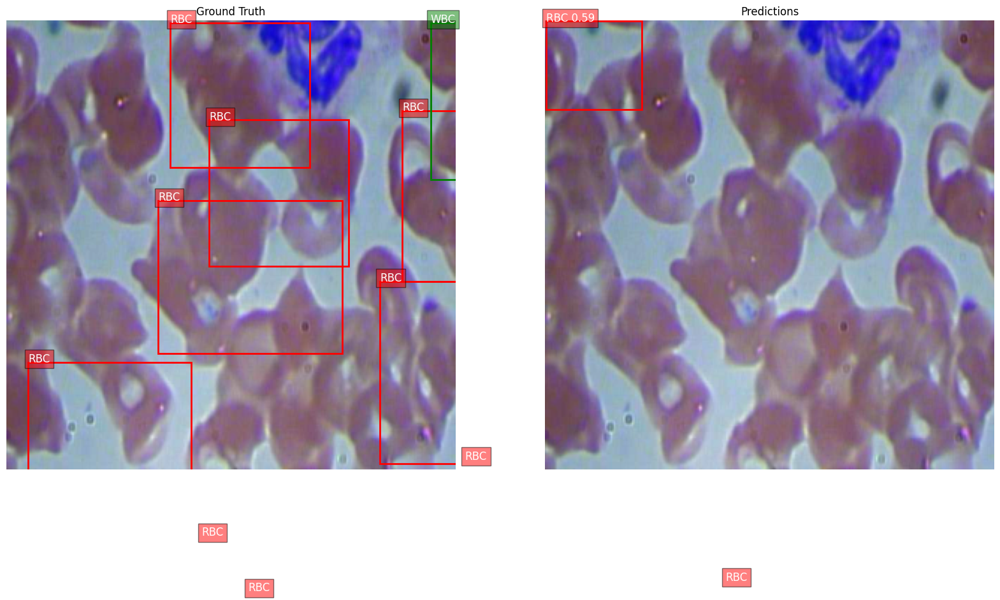

2025-04-06 11:02:33,791 - INFO - Начало эпохи 2
Epoch 2: 100%|██████████████████████████████████| 52/52 [01:10<00:00,  1.36s/it]


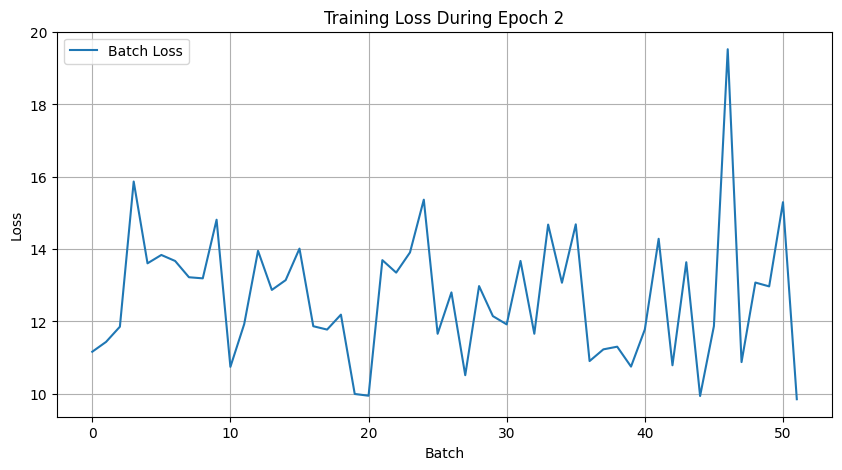

2025-04-06 11:03:44,776 - INFO - Epoch 2: Loss: 12.6792
2025-04-06 11:03:44,776 - INFO - Начало эпохи 3
Epoch 3: 100%|██████████████████████████████████| 52/52 [01:22<00:00,  1.59s/it]


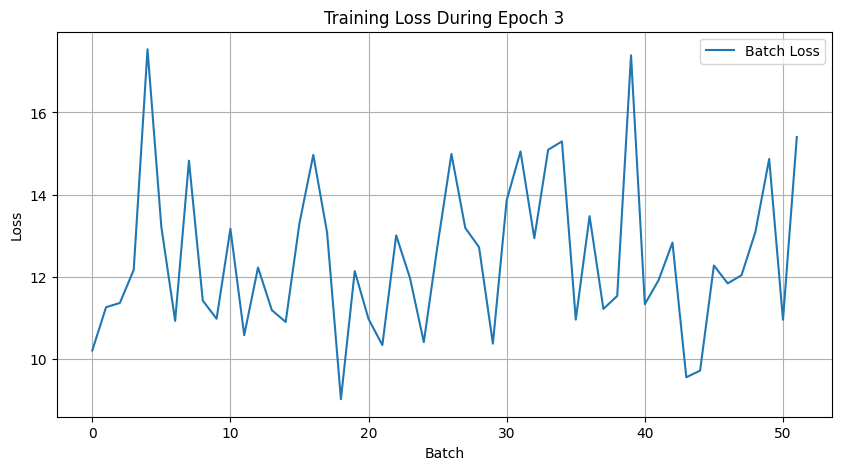

2025-04-06 11:05:07,373 - INFO - Epoch 3: Loss: 12.4558
Вычисление метрик: 100%|████████████████████████| 87/87 [00:21<00:00,  4.08it/s]


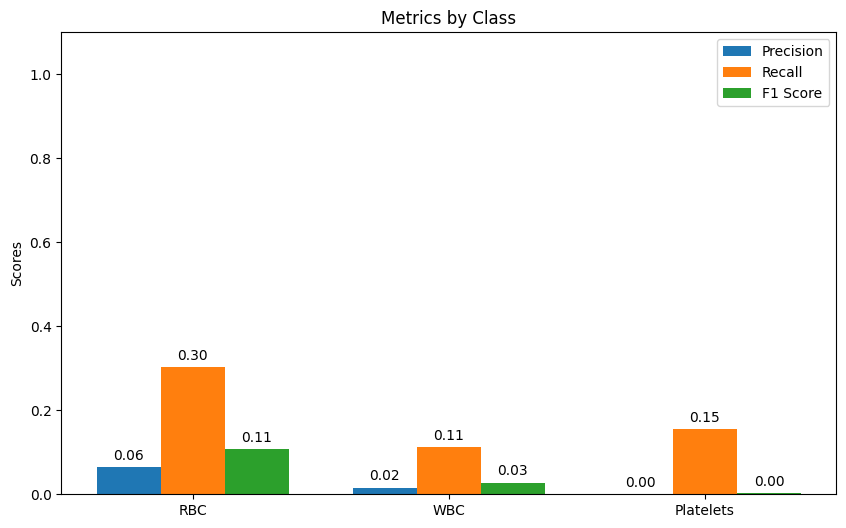

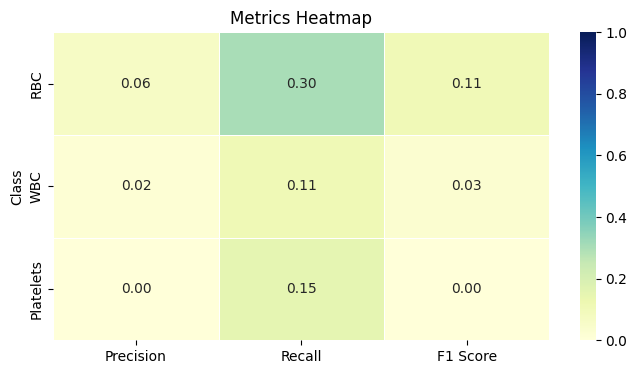

2025-04-06 11:05:28,874 - INFO - Metrics:
2025-04-06 11:05:28,875 - INFO - RBC: Precision=0.065, Recall=0.303, F1=0.107
2025-04-06 11:05:28,875 - INFO - WBC: Precision=0.016, Recall=0.112, F1=0.028
2025-04-06 11:05:28,875 - INFO - Platelets: Precision=0.001, Recall=0.155, F1=0.002


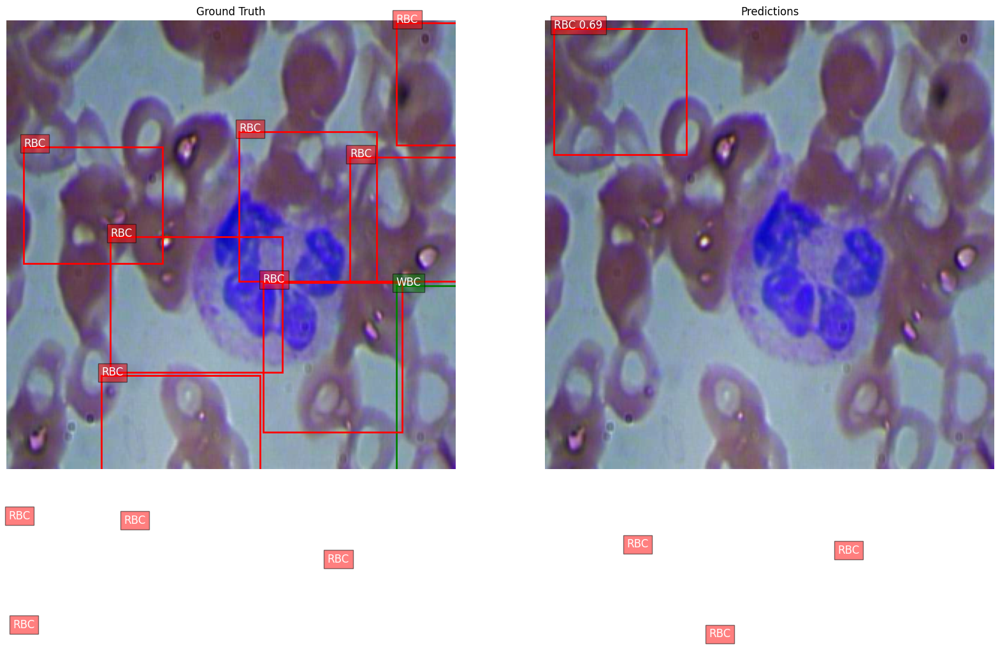

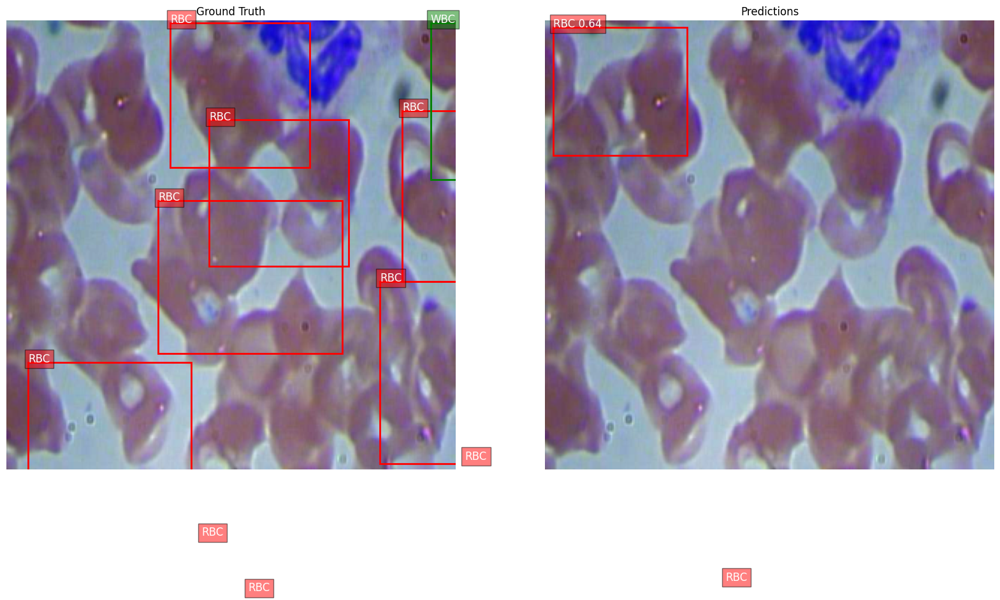

2025-04-06 11:05:30,895 - INFO - Начало эпохи 4
Epoch 4: 100%|██████████████████████████████████| 52/52 [01:05<00:00,  1.27s/it]


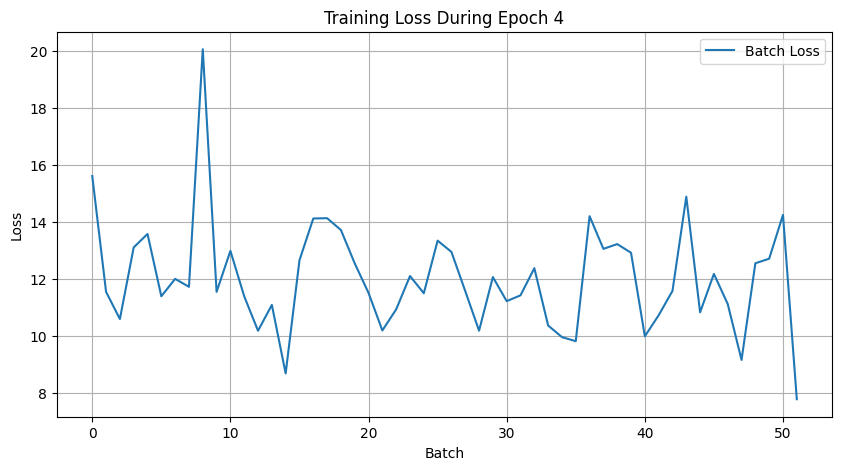

2025-04-06 11:06:36,811 - INFO - Epoch 4: Loss: 12.0299
2025-04-06 11:06:36,812 - INFO - Начало эпохи 5
Epoch 5: 100%|██████████████████████████████████| 52/52 [01:03<00:00,  1.22s/it]


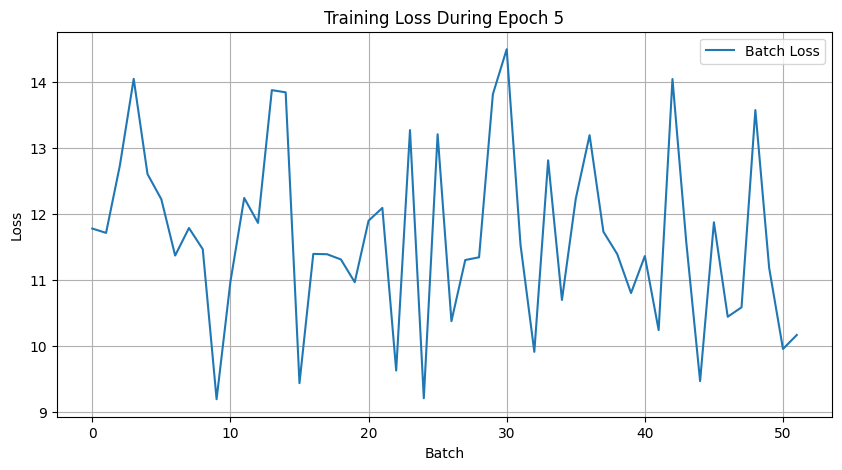

2025-04-06 11:07:40,433 - INFO - Epoch 5: Loss: 11.6447
Вычисление метрик: 100%|████████████████████████| 87/87 [00:12<00:00,  6.94it/s]


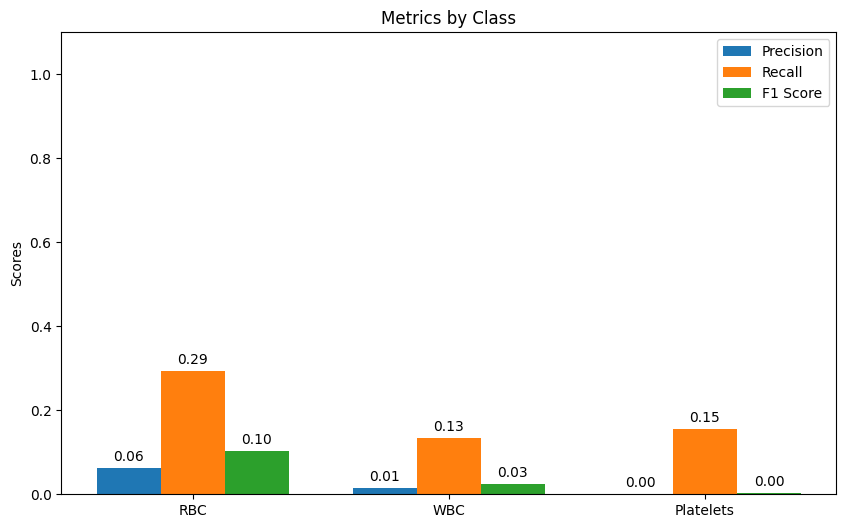

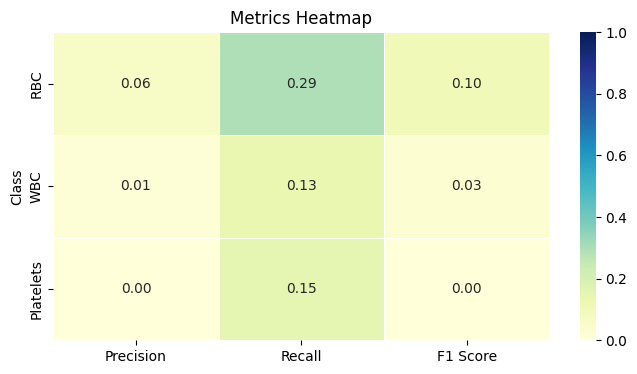

2025-04-06 11:07:53,121 - INFO - Metrics:
2025-04-06 11:07:53,122 - INFO - RBC: Precision=0.062, Recall=0.294, F1=0.102
2025-04-06 11:07:53,122 - INFO - WBC: Precision=0.014, Recall=0.135, F1=0.025
2025-04-06 11:07:53,123 - INFO - Platelets: Precision=0.001, Recall=0.155, F1=0.002


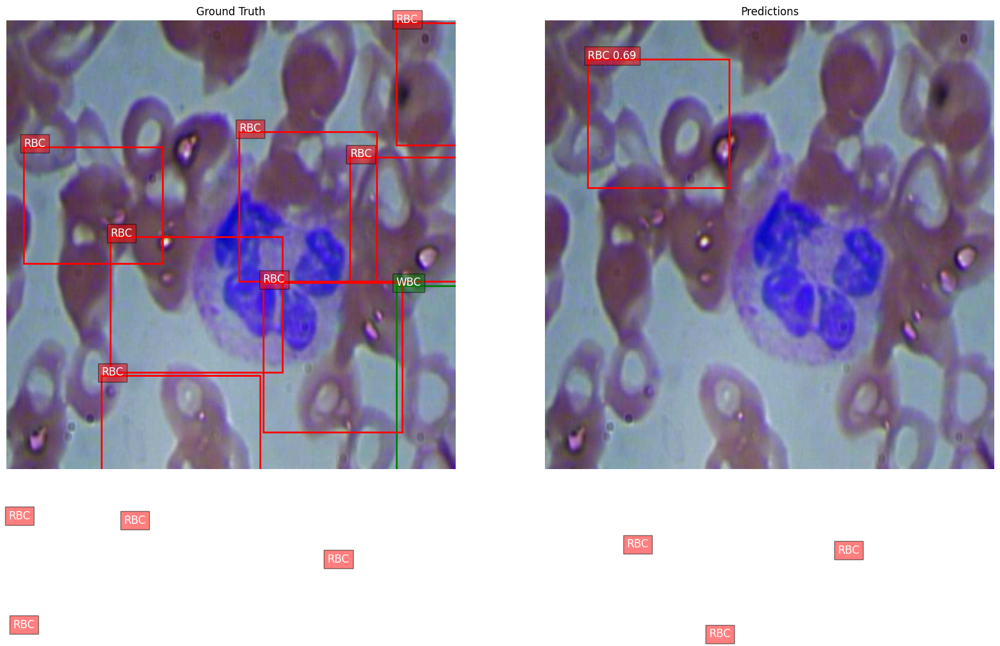

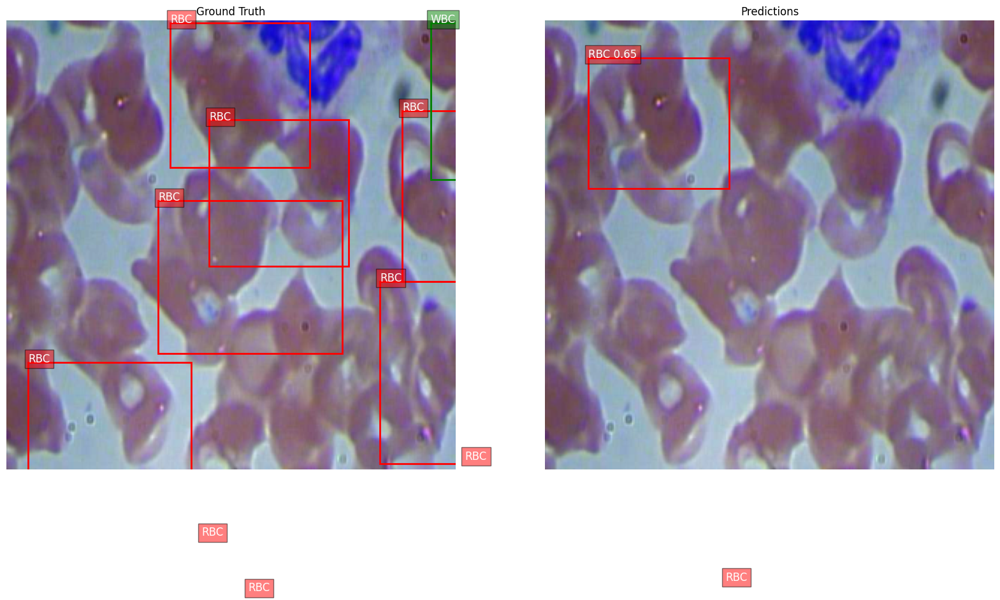

2025-04-06 11:07:55,056 - INFO - Начало эпохи 6
Epoch 6: 100%|██████████████████████████████████| 52/52 [01:04<00:00,  1.24s/it]


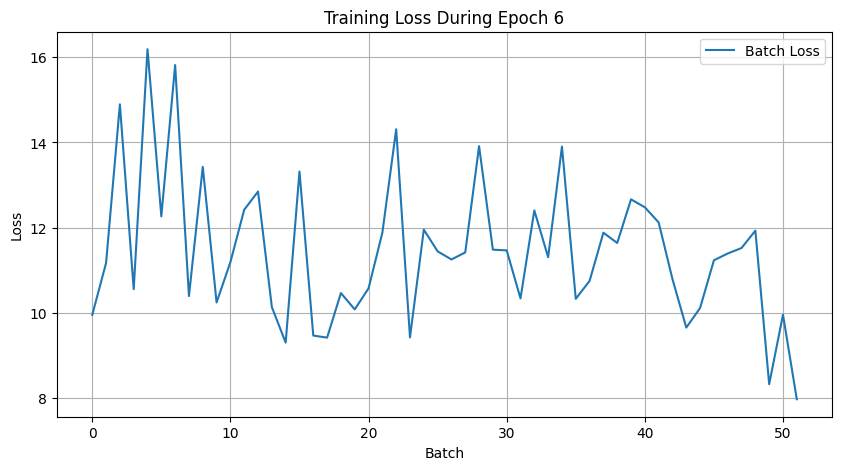

2025-04-06 11:08:59,667 - INFO - Epoch 6: Loss: 11.4507
2025-04-06 11:08:59,668 - INFO - Начало эпохи 7
Epoch 7: 100%|██████████████████████████████████| 52/52 [01:04<00:00,  1.24s/it]


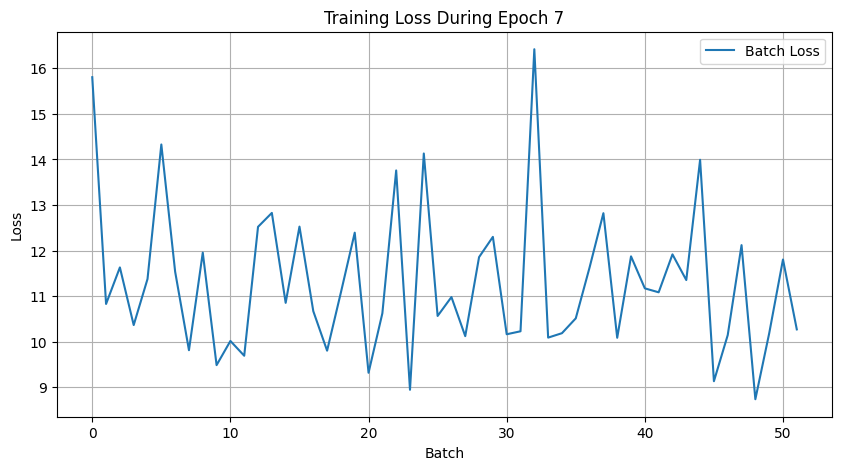

2025-04-06 11:10:04,157 - INFO - Epoch 7: Loss: 11.3088
Вычисление метрик: 100%|████████████████████████| 87/87 [00:12<00:00,  6.90it/s]


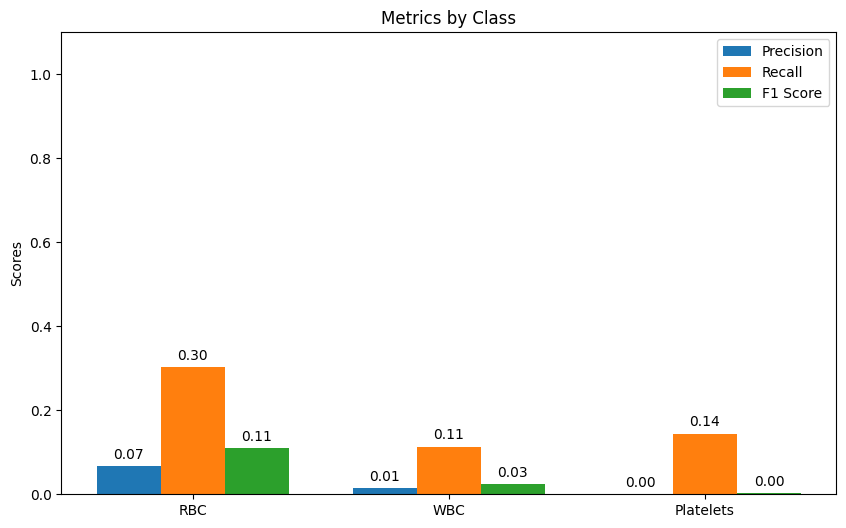

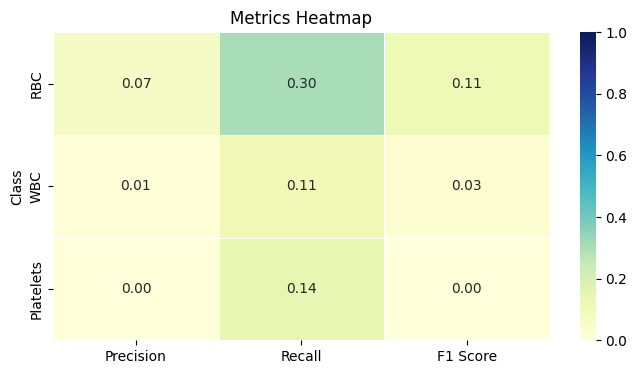

2025-04-06 11:10:16,921 - INFO - Metrics:
2025-04-06 11:10:16,922 - INFO - RBC: Precision=0.067, Recall=0.302, F1=0.110
2025-04-06 11:10:16,922 - INFO - WBC: Precision=0.014, Recall=0.114, F1=0.025
2025-04-06 11:10:16,922 - INFO - Platelets: Precision=0.001, Recall=0.145, F1=0.002


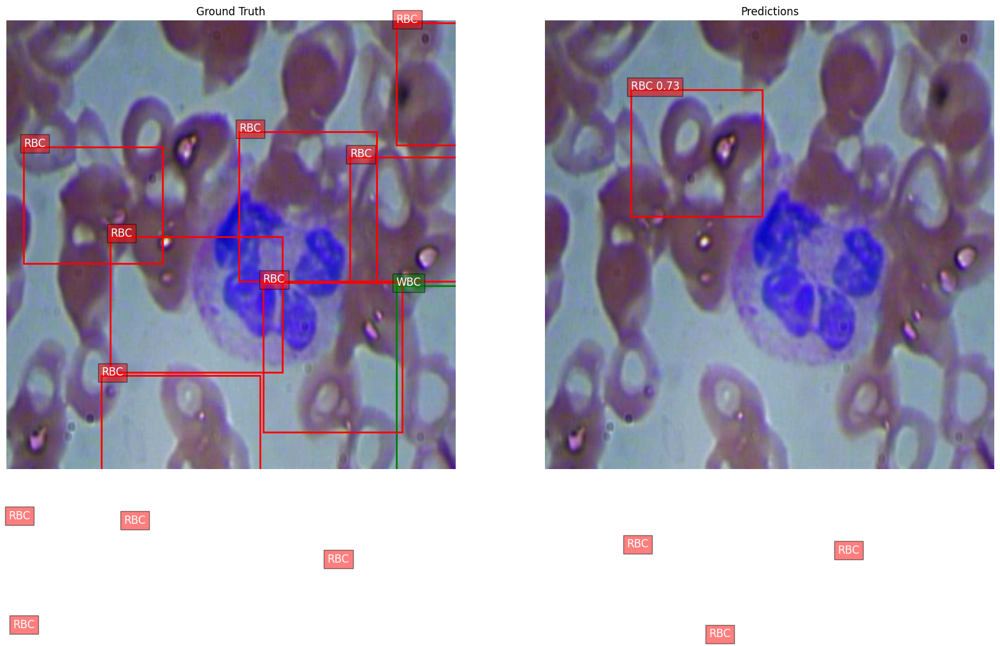

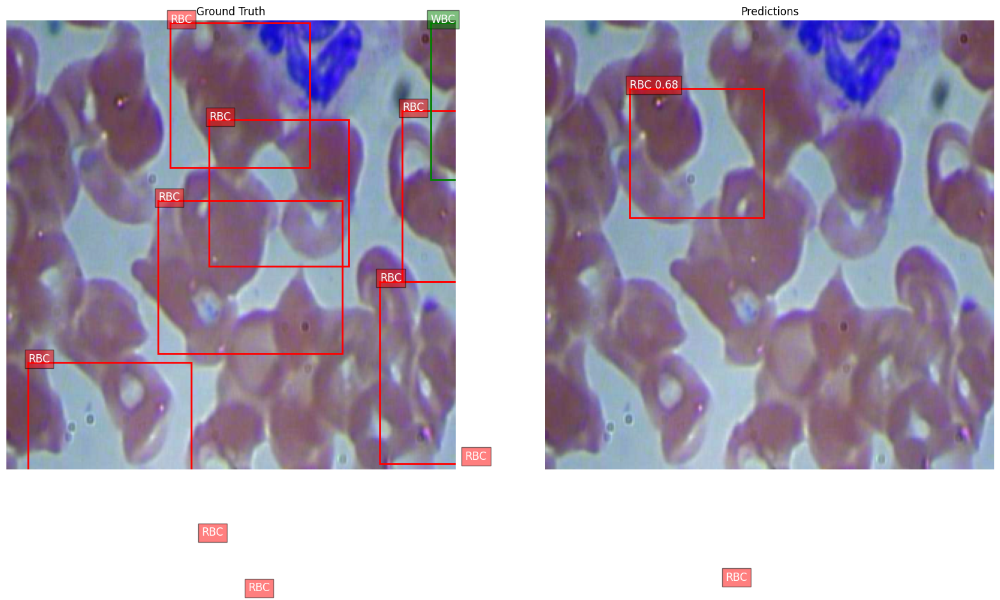

2025-04-06 11:10:19,472 - INFO - Начало эпохи 8
Epoch 8: 100%|██████████████████████████████████| 52/52 [01:04<00:00,  1.24s/it]


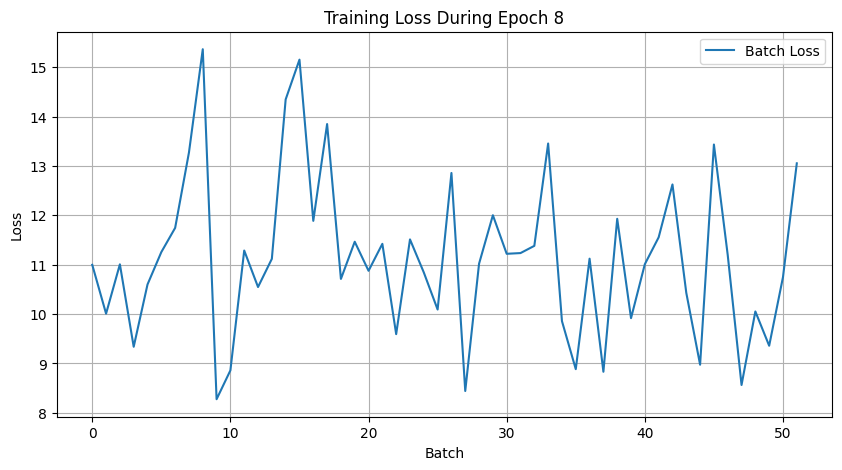

2025-04-06 11:11:23,861 - INFO - Epoch 8: Loss: 11.1266
2025-04-06 11:11:23,861 - INFO - Начало эпохи 9
Epoch 9: 100%|██████████████████████████████████| 52/52 [01:00<00:00,  1.17s/it]


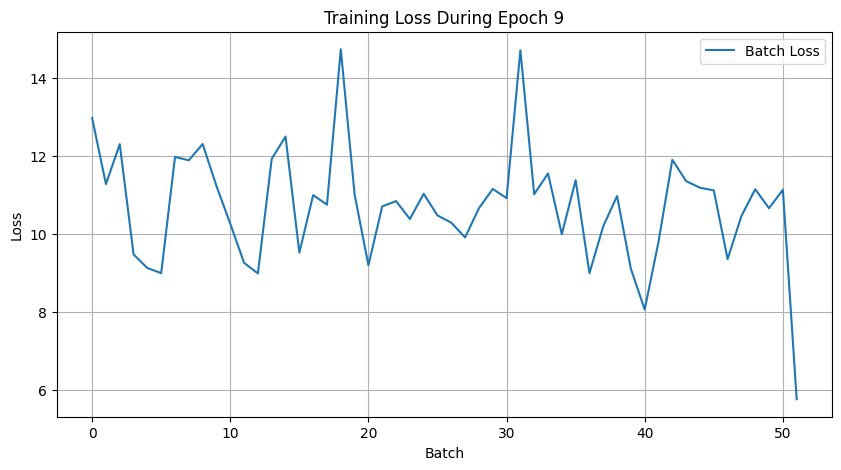

2025-04-06 11:12:24,788 - INFO - Epoch 9: Loss: 10.7090
Вычисление метрик: 100%|████████████████████████| 87/87 [00:13<00:00,  6.49it/s]


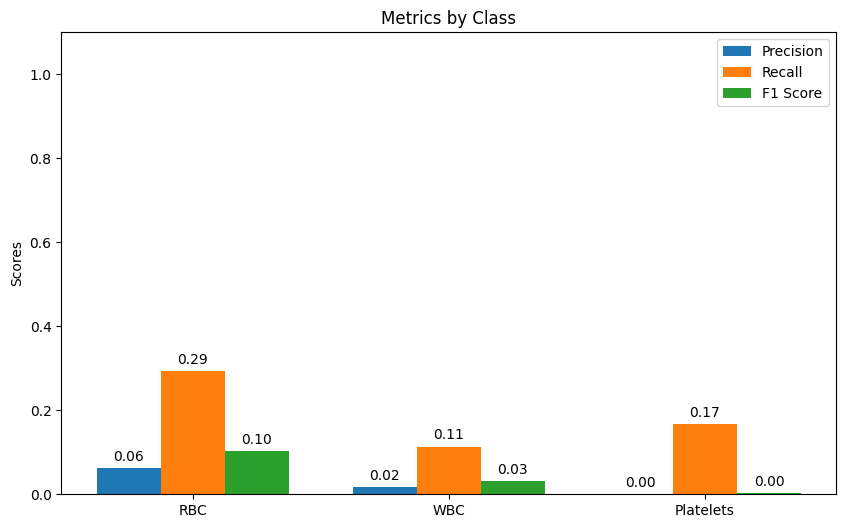

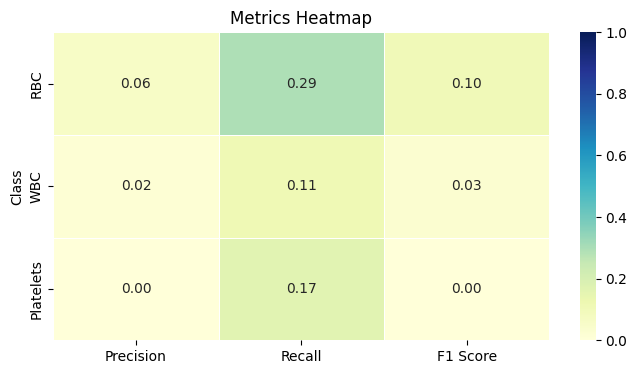

2025-04-06 11:12:38,354 - INFO - Metrics:
2025-04-06 11:12:38,355 - INFO - RBC: Precision=0.062, Recall=0.294, F1=0.102
2025-04-06 11:12:38,355 - INFO - WBC: Precision=0.018, Recall=0.114, F1=0.031
2025-04-06 11:12:38,355 - INFO - Platelets: Precision=0.001, Recall=0.167, F1=0.002


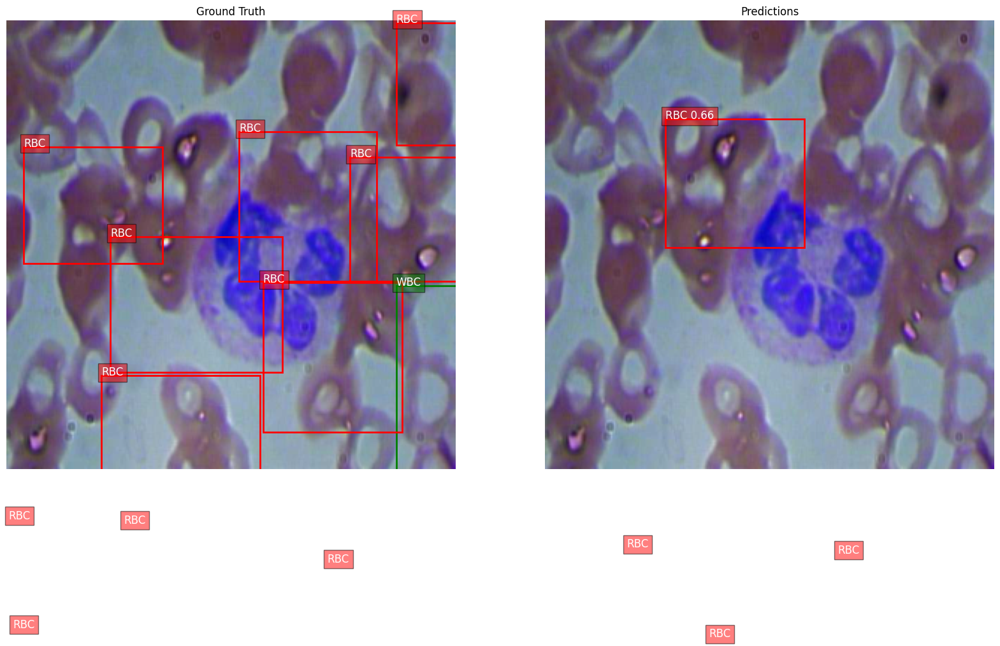

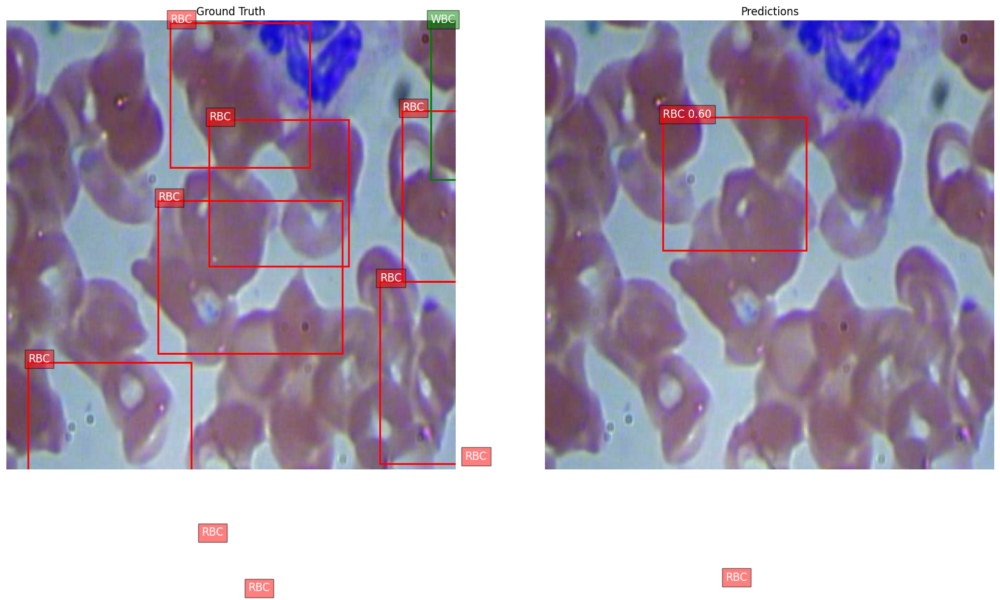

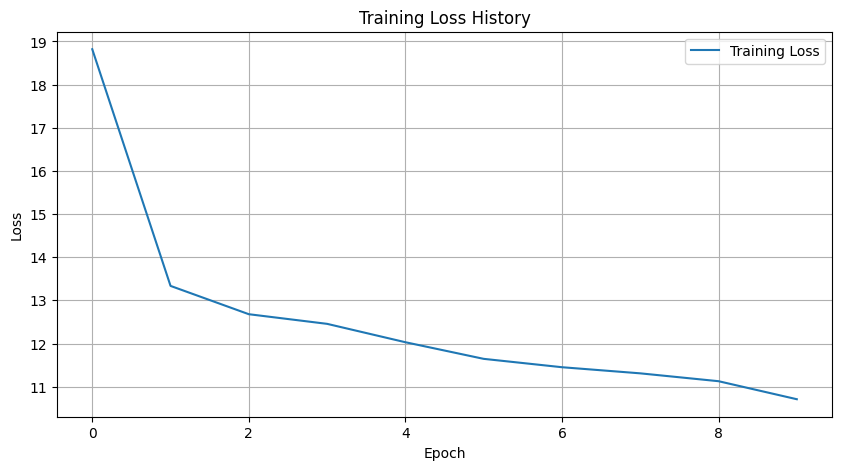

In [115]:
def main():
    # Параметры
    dataset_path = "BCCD_Dataset/BCCD"
    num_classes = 4
    batch_size = 4
    num_epochs = 10

    # Преобразования к изображениям
    transform = torchvision.transforms.Compose([
        torchvision.transforms.Resize((300, 300)),
        torchvision.transforms.ToTensor(),
        torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                         std=[0.229, 0.224, 0.225])
    ])

    # Создание датасетов
    train_dataset = BCCDDataset(dataset_path, 'train', transform)
    val_dataset = BCCDDataset(dataset_path, 'val', transform)

    # DataLoader-ы
    train_loader = DataLoader(
        train_dataset, batch_size=batch_size, shuffle=True,
        collate_fn=collate_fn, num_workers=4
    )
    val_loader = DataLoader(
        val_dataset, batch_size=1, shuffle=False,
        collate_fn=collate_fn, num_workers=2
    )

    # Модель и оптимизатор
    model = create_model(num_classes)
    optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)

    # Обучение модели
    train_losses = []
    for epoch in range(num_epochs):
        logging.info(f"Начало эпохи {epoch}")
        train_loss = train_one_epoch(model, optimizer, train_loader, device, epoch)
        train_losses.append(train_loss)
        logging.info(f"Epoch {epoch}: Loss: {train_loss:.4f}")

        # Периодическая оценка модели
        if (epoch + 1) % 2 == 0:
            metrics = calculate_metrics(model, val_loader, device)
            logging.info("Metrics:")
            for cls, vals in metrics.items():
                logging.info(f"{cls}: Precision={vals['precision']:.3f}, Recall={vals['recall']:.3f}, F1={vals['f1']:.3f}")

            visualize_predictions(model, val_loader, device, num_images=2)

    # Визуализация истории обучения
    plot_training_history(train_losses)

    # Сохранение модели
    torch.save(model.state_dict(), "ssd_bccd.pth")


if __name__ == "__main__":
    main()


## 2.9 Выводы: 

1. loss постепенно уменьшается от 18.8204 до 10.7090 за 10 эпох. Это хороший знак, так как указывает на то, что модель обучается и корректирует свои предсказания.
   
2. Метрики (Precision, Recall, F1) для каждого класса:
RBC: Precision=0.062, Recall=0.294, F1=0.102
WBC: Precision=0.018, Recall=0.114, F1=0.031
Platelets: Precision=0.001, Recall=0.167, F1=0.002
Значения метрик показывают, что:
Precision (точность) для всех классов довольно низкий, что указывает на то, что многие предсказанные объекты не являются истинными положительными.
Recall (полнота) для классов RBC и Platelets относительно выше, чем для WBC, но все еще оставляет желать лучшего.
F1-score для всех классов также низкий, что указывает на необходимость улучшения как точности, так и полноты.


# 3. Модель SSD300

утилиты и сама модель взяты из источника предложенного в домашнем задании

Checking dataset structure...
Annotations exist: True
JPEGImages exist: True
ImageSets exist: True

Checking created JSON files...
TRAIN_images.json exists: True
  Contains 292 items
TRAIN_objects.json exists: True
  Contains 292 items
TEST_images.json exists: True
  Contains 72 items
TEST_objects.json exists: True
  Contains 72 items

Processing training data...


100%|██████████████████████████████████████| 292/292 [00:00<00:00, 10010.76it/s]



Processing test data...


100%|█████████████████████████████████████████| 72/72 [00:00<00:00, 9572.09it/s]


Summary:
Training images: 292
Training objects: 3941
Test images: 72
Test objects: 945
Files saved to: /home/dzmitry/Рабочий стол/module_7 домашка/BCCD_Dataset/BCCD



Loaded base model.

Epoch: [0][0/37]	Batch Time 0.664 (0.664)	Data Time 0.449 (0.449)	Loss 16.1262 (16.1262)	


Evaluating:   0%|                                         | 0/9 [00:00<?, ?it/s]/tmp/ipykernel_3909/1908995651.py:815: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /pytorch/aten/src/ATen/native/IndexingUtils.h:29.)
  image_boxes.append(class_decoded_locs[1 - suppress])
/tmp/ipykernel_3909/1908995651.py:817: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at /pytorch/aten/src/ATen/native/IndexingUtils.h:29.)
  image_scores.append(class_scores[1 - suppress])
Evaluating: 100%|█████████████████████████████████| 9/9 [00:29<00:00,  3.23s/it]


{'Platelets': 0.035001177340745926,
 'RBC': 0.5630037188529968,
 'WBC': 0.05432372912764549}

Mean Average Precision (mAP): 0.217
Epoch: [1][0/37]	Batch Time 0.595 (0.595)	Data Time 0.383 (0.383)	Loss 5.8815 (5.8815)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:15<00:00,  1.68s/it]


{'Platelets': 0.006947785150259733, 'RBC': 0.6373341679573059, 'WBC': 0.0}

Mean Average Precision (mAP): 0.215
Epoch: [2][0/37]	Batch Time 0.606 (0.606)	Data Time 0.394 (0.394)	Loss 4.2901 (4.2901)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:10<00:00,  1.17s/it]


{'Platelets': 0.33447518944740295,
 'RBC': 0.3199867308139801,
 'WBC': 0.010791788809001446}

Mean Average Precision (mAP): 0.222
Epoch: [3][0/37]	Batch Time 0.787 (0.787)	Data Time 0.574 (0.574)	Loss 4.1157 (4.1157)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:10<00:00,  1.22s/it]


{'Platelets': 0.3274361491203308,
 'RBC': 0.689601480960846,
 'WBC': 0.004545454867184162}

Mean Average Precision (mAP): 0.341
Epoch: [4][0/37]	Batch Time 0.512 (0.512)	Data Time 0.298 (0.298)	Loss 4.0465 (4.0465)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:11<00:00,  1.31s/it]


{'Platelets': 0.4104200005531311,
 'RBC': 0.7360730767250061,
 'WBC': 0.019841395318508148}

Mean Average Precision (mAP): 0.389
Epoch: [5][0/37]	Batch Time 0.623 (0.623)	Data Time 0.410 (0.410)	Loss 3.5754 (3.5754)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:08<00:00,  1.01it/s]


{'Platelets': 0.3559105098247528,
 'RBC': 0.7614045143127441,
 'WBC': 0.0911707803606987}

Mean Average Precision (mAP): 0.403
Epoch: [6][0/37]	Batch Time 0.664 (0.664)	Data Time 0.451 (0.451)	Loss 3.4894 (3.4894)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:11<00:00,  1.30s/it]


{'Platelets': 0.4040846824645996,
 'RBC': 0.684934139251709,
 'WBC': 0.2779395878314972}

Mean Average Precision (mAP): 0.456
Epoch: [7][0/37]	Batch Time 0.556 (0.556)	Data Time 0.343 (0.343)	Loss 3.6281 (3.6281)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:09<00:00,  1.10s/it]


{'Platelets': 0.6099353432655334,
 'RBC': 0.7471804618835449,
 'WBC': 0.5264603495597839}

Mean Average Precision (mAP): 0.628
Epoch: [8][0/37]	Batch Time 0.572 (0.572)	Data Time 0.360 (0.360)	Loss 3.5474 (3.5474)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:10<00:00,  1.20s/it]


{'Platelets': 0.6353505253791809,
 'RBC': 0.6925591230392456,
 'WBC': 0.7517110705375671}

Mean Average Precision (mAP): 0.693
Epoch: [9][0/37]	Batch Time 0.710 (0.710)	Data Time 0.500 (0.500)	Loss 3.1349 (3.1349)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:06<00:00,  1.31it/s]


{'Platelets': 0.6714310050010681,
 'RBC': 0.6676983833312988,
 'WBC': 0.7754298448562622}

Mean Average Precision (mAP): 0.705
Epoch: [10][0/37]	Batch Time 0.615 (0.615)	Data Time 0.402 (0.402)	Loss 3.1052 (3.1052)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:09<00:00,  1.00s/it]


{'Platelets': 0.5935318470001221,
 'RBC': 0.7276614904403687,
 'WBC': 0.8327439427375793}

Mean Average Precision (mAP): 0.718
Epoch: [11][0/37]	Batch Time 0.590 (0.590)	Data Time 0.377 (0.377)	Loss 2.8406 (2.8406)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:06<00:00,  1.49it/s]


{'Platelets': 0.6909071803092957,
 'RBC': 0.7006866335868835,
 'WBC': 0.7896857857704163}

Mean Average Precision (mAP): 0.727
Epoch: [12][0/37]	Batch Time 0.524 (0.524)	Data Time 0.311 (0.311)	Loss 2.9028 (2.9028)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:06<00:00,  1.29it/s]


{'Platelets': 0.6850550770759583,
 'RBC': 0.7466094493865967,
 'WBC': 0.7872036099433899}

Mean Average Precision (mAP): 0.740
Epoch: [13][0/37]	Batch Time 0.757 (0.757)	Data Time 0.546 (0.546)	Loss 2.9729 (2.9729)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:06<00:00,  1.33it/s]


{'Platelets': 0.660129725933075,
 'RBC': 0.7422606348991394,
 'WBC': 0.7315528392791748}

Mean Average Precision (mAP): 0.711
Epoch: [14][0/37]	Batch Time 0.658 (0.658)	Data Time 0.445 (0.445)	Loss 3.5303 (3.5303)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:07<00:00,  1.27it/s]


{'Platelets': 0.628744900226593,
 'RBC': 0.7682880163192749,
 'WBC': 0.8621262907981873}

Mean Average Precision (mAP): 0.753
Epoch: [15][0/37]	Batch Time 0.581 (0.581)	Data Time 0.369 (0.369)	Loss 3.0113 (3.0113)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:06<00:00,  1.33it/s]


{'Platelets': 0.6674275398254395,
 'RBC': 0.6958824992179871,
 'WBC': 0.9014344811439514}

Mean Average Precision (mAP): 0.755
Epoch: [16][0/37]	Batch Time 0.761 (0.761)	Data Time 0.551 (0.551)	Loss 3.2869 (3.2869)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:08<00:00,  1.10it/s]


{'Platelets': 0.6984410285949707,
 'RBC': 0.759547770023346,
 'WBC': 0.8983124494552612}

Mean Average Precision (mAP): 0.785
Epoch: [17][0/37]	Batch Time 0.566 (0.566)	Data Time 0.353 (0.353)	Loss 2.7367 (2.7367)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:08<00:00,  1.10it/s]


{'Platelets': 0.6447974443435669,
 'RBC': 0.7543519139289856,
 'WBC': 0.8067389726638794}

Mean Average Precision (mAP): 0.735
Epoch: [18][0/37]	Batch Time 0.607 (0.607)	Data Time 0.393 (0.393)	Loss 2.5084 (2.5084)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:06<00:00,  1.42it/s]


{'Platelets': 0.7016042470932007,
 'RBC': 0.757927656173706,
 'WBC': 0.9216062426567078}

Mean Average Precision (mAP): 0.794
Epoch: [19][0/37]	Batch Time 0.697 (0.697)	Data Time 0.483 (0.483)	Loss 2.8750 (2.8750)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:07<00:00,  1.24it/s]


{'Platelets': 0.7051328420639038,
 'RBC': 0.7726761698722839,
 'WBC': 0.9289193749427795}

Mean Average Precision (mAP): 0.802
Epoch: [20][0/37]	Batch Time 0.685 (0.685)	Data Time 0.471 (0.471)	Loss 2.8103 (2.8103)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:06<00:00,  1.46it/s]


{'Platelets': 0.6903145909309387,
 'RBC': 0.7624731063842773,
 'WBC': 0.9326640367507935}

Mean Average Precision (mAP): 0.795
Epoch: [21][0/37]	Batch Time 0.561 (0.561)	Data Time 0.344 (0.344)	Loss 2.6078 (2.6078)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:05<00:00,  1.56it/s]


{'Platelets': 0.7108900547027588,
 'RBC': 0.7567952275276184,
 'WBC': 0.867746114730835}

Mean Average Precision (mAP): 0.778
Epoch: [22][0/37]	Batch Time 0.666 (0.666)	Data Time 0.454 (0.454)	Loss 2.6785 (2.6785)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:05<00:00,  1.63it/s]


{'Platelets': 0.6901571154594421,
 'RBC': 0.7729127407073975,
 'WBC': 0.9654685258865356}

Mean Average Precision (mAP): 0.810
Epoch: [23][0/37]	Batch Time 0.499 (0.499)	Data Time 0.285 (0.285)	Loss 2.7725 (2.7725)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:05<00:00,  1.52it/s]


{'Platelets': 0.7063707709312439,
 'RBC': 0.7787120342254639,
 'WBC': 0.9594481587409973}

Mean Average Precision (mAP): 0.815
Epoch: [24][0/37]	Batch Time 0.671 (0.671)	Data Time 0.457 (0.457)	Loss 2.8495 (2.8495)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:05<00:00,  1.59it/s]


{'Platelets': 0.6785691380500793,
 'RBC': 0.7562488317489624,
 'WBC': 0.8837949633598328}

Mean Average Precision (mAP): 0.773
Epoch: [25][0/37]	Batch Time 0.688 (0.688)	Data Time 0.474 (0.474)	Loss 2.7610 (2.7610)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:04<00:00,  1.82it/s]


{'Platelets': 0.6839026808738708,
 'RBC': 0.7736659049987793,
 'WBC': 0.9705529808998108}

Mean Average Precision (mAP): 0.809
Epoch: [26][0/37]	Batch Time 0.501 (0.501)	Data Time 0.289 (0.289)	Loss 3.0466 (3.0466)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:06<00:00,  1.43it/s]


{'Platelets': 0.7030798196792603,
 'RBC': 0.7747012376785278,
 'WBC': 0.9648793339729309}

Mean Average Precision (mAP): 0.814
Epoch: [27][0/37]	Batch Time 0.708 (0.708)	Data Time 0.496 (0.496)	Loss 2.6158 (2.6158)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:04<00:00,  1.84it/s]


{'Platelets': 0.689947783946991,
 'RBC': 0.7725138664245605,
 'WBC': 0.9694207310676575}

Mean Average Precision (mAP): 0.811
Epoch: [28][0/37]	Batch Time 0.662 (0.662)	Data Time 0.451 (0.451)	Loss 2.3975 (2.3975)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:05<00:00,  1.71it/s]


{'Platelets': 0.7101255059242249,
 'RBC': 0.7655746340751648,
 'WBC': 0.9693630933761597}

Mean Average Precision (mAP): 0.815
Epoch: [29][0/37]	Batch Time 0.653 (0.653)	Data Time 0.440 (0.440)	Loss 2.6851 (2.6851)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:06<00:00,  1.38it/s]


{'Platelets': 0.7003072500228882,
 'RBC': 0.7721816301345825,
 'WBC': 0.9636954069137573}

Mean Average Precision (mAP): 0.812
Epoch: [30][0/37]	Batch Time 0.549 (0.549)	Data Time 0.335 (0.335)	Loss 2.6830 (2.6830)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:04<00:00,  2.16it/s]


{'Platelets': 0.6890770792961121,
 'RBC': 0.7766497731208801,
 'WBC': 0.9738742113113403}

Mean Average Precision (mAP): 0.813
Epoch: [31][0/37]	Batch Time 0.584 (0.584)	Data Time 0.371 (0.371)	Loss 2.5150 (2.5150)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:06<00:00,  1.41it/s]


{'Platelets': 0.7281940579414368,
 'RBC': 0.783780038356781,
 'WBC': 0.9462177157402039}

Mean Average Precision (mAP): 0.819
Epoch: [32][0/37]	Batch Time 0.869 (0.869)	Data Time 0.656 (0.656)	Loss 2.9071 (2.9071)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:05<00:00,  1.62it/s]


{'Platelets': 0.6941255331039429,
 'RBC': 0.7842593193054199,
 'WBC': 0.9684821367263794}

Mean Average Precision (mAP): 0.816
Epoch: [33][0/37]	Batch Time 0.520 (0.520)	Data Time 0.306 (0.306)	Loss 2.4995 (2.4995)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:05<00:00,  1.58it/s]


{'Platelets': 0.7462878823280334,
 'RBC': 0.789787769317627,
 'WBC': 0.9727101922035217}

Mean Average Precision (mAP): 0.836
Epoch: [34][0/37]	Batch Time 0.722 (0.722)	Data Time 0.508 (0.508)	Loss 2.4570 (2.4570)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:04<00:00,  1.82it/s]


{'Platelets': 0.6974117159843445,
 'RBC': 0.7853885293006897,
 'WBC': 0.9737140536308289}

Mean Average Precision (mAP): 0.819
Epoch: [35][0/37]	Batch Time 0.697 (0.697)	Data Time 0.484 (0.484)	Loss 2.3763 (2.3763)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:04<00:00,  1.86it/s]


{'Platelets': 0.6827791333198547,
 'RBC': 0.7885176539421082,
 'WBC': 0.969056248664856}

Mean Average Precision (mAP): 0.813
Epoch: [36][0/37]	Batch Time 0.809 (0.809)	Data Time 0.596 (0.596)	Loss 2.5716 (2.5716)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:06<00:00,  1.41it/s]


{'Platelets': 0.6956402063369751,
 'RBC': 0.7894954085350037,
 'WBC': 0.9745650291442871}

Mean Average Precision (mAP): 0.820
Epoch: [37][0/37]	Batch Time 0.610 (0.610)	Data Time 0.398 (0.398)	Loss 2.5109 (2.5109)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:04<00:00,  1.88it/s]


{'Platelets': 0.7339547276496887,
 'RBC': 0.78781658411026,
 'WBC': 0.972213089466095}

Mean Average Precision (mAP): 0.831
Epoch: [38][0/37]	Batch Time 0.603 (0.603)	Data Time 0.390 (0.390)	Loss 2.6154 (2.6154)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:05<00:00,  1.67it/s]


{'Platelets': 0.6972987651824951,
 'RBC': 0.7839534878730774,
 'WBC': 0.9698656797409058}

Mean Average Precision (mAP): 0.817
Epoch: [39][0/37]	Batch Time 0.639 (0.639)	Data Time 0.426 (0.426)	Loss 2.4105 (2.4105)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:05<00:00,  1.75it/s]


{'Platelets': 0.7222421765327454,
 'RBC': 0.7873671650886536,
 'WBC': 0.9762284755706787}

Mean Average Precision (mAP): 0.829
Epoch: [40][0/37]	Batch Time 0.557 (0.557)	Data Time 0.344 (0.344)	Loss 2.4783 (2.4783)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:04<00:00,  2.06it/s]


{'Platelets': 0.7714740037918091,
 'RBC': 0.7848750352859497,
 'WBC': 0.9711175560951233}

Mean Average Precision (mAP): 0.842
Epoch: [41][0/37]	Batch Time 0.675 (0.675)	Data Time 0.463 (0.463)	Loss 2.2331 (2.2331)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:05<00:00,  1.77it/s]


{'Platelets': 0.7427594065666199,
 'RBC': 0.7770533561706543,
 'WBC': 0.9704495668411255}

Mean Average Precision (mAP): 0.830
Epoch: [42][0/37]	Batch Time 0.602 (0.602)	Data Time 0.389 (0.389)	Loss 2.4362 (2.4362)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:05<00:00,  1.79it/s]


{'Platelets': 0.6973166465759277,
 'RBC': 0.7881417870521545,
 'WBC': 0.979835033416748}

Mean Average Precision (mAP): 0.822
Epoch: [43][0/37]	Batch Time 0.680 (0.680)	Data Time 0.467 (0.467)	Loss 2.6255 (2.6255)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:05<00:00,  1.61it/s]


{'Platelets': 0.6742034554481506,
 'RBC': 0.7828292846679688,
 'WBC': 0.9806296825408936}

Mean Average Precision (mAP): 0.813
Epoch: [44][0/37]	Batch Time 0.727 (0.727)	Data Time 0.516 (0.516)	Loss 2.7533 (2.7533)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:05<00:00,  1.63it/s]


{'Platelets': 0.6848558783531189,
 'RBC': 0.78879314661026,
 'WBC': 0.9769961833953857}

Mean Average Precision (mAP): 0.817
Epoch: [45][0/37]	Batch Time 0.546 (0.546)	Data Time 0.334 (0.334)	Loss 2.3326 (2.3326)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:05<00:00,  1.72it/s]


{'Platelets': 0.7008723616600037,
 'RBC': 0.7836515307426453,
 'WBC': 0.9724242687225342}

Mean Average Precision (mAP): 0.819
Epoch: [46][0/37]	Batch Time 0.728 (0.728)	Data Time 0.516 (0.516)	Loss 2.3409 (2.3409)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:04<00:00,  2.20it/s]


{'Platelets': 0.7255271077156067,
 'RBC': 0.7888452410697937,
 'WBC': 0.9702927470207214}

Mean Average Precision (mAP): 0.828
Epoch: [47][0/37]	Batch Time 0.514 (0.514)	Data Time 0.302 (0.302)	Loss 2.3713 (2.3713)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:03<00:00,  2.25it/s]


{'Platelets': 0.7446971535682678,
 'RBC': 0.7874583601951599,
 'WBC': 0.9668658971786499}

Mean Average Precision (mAP): 0.833
Epoch: [48][0/37]	Batch Time 0.619 (0.619)	Data Time 0.404 (0.404)	Loss 2.4327 (2.4327)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:04<00:00,  2.12it/s]


{'Platelets': 0.7154554128646851,
 'RBC': 0.7799709439277649,
 'WBC': 0.9688708186149597}

Mean Average Precision (mAP): 0.821
Epoch: [49][0/37]	Batch Time 0.847 (0.847)	Data Time 0.637 (0.637)	Loss 2.5481 (2.5481)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:04<00:00,  1.88it/s]


{'Platelets': 0.7024149894714355,
 'RBC': 0.7887921333312988,
 'WBC': 0.9769762754440308}

Mean Average Precision (mAP): 0.823
Epoch: [50][0/37]	Batch Time 0.632 (0.632)	Data Time 0.420 (0.420)	Loss 2.6706 (2.6706)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:04<00:00,  2.17it/s]


{'Platelets': 0.708000123500824,
 'RBC': 0.7792829275131226,
 'WBC': 0.9797991514205933}

Mean Average Precision (mAP): 0.822
Epoch: [51][0/37]	Batch Time 0.539 (0.539)	Data Time 0.324 (0.324)	Loss 2.6815 (2.6815)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:03<00:00,  2.27it/s]


{'Platelets': 0.7794866561889648,
 'RBC': 0.7892528176307678,
 'WBC': 0.9677838087081909}

Mean Average Precision (mAP): 0.846
Epoch: [52][0/37]	Batch Time 0.647 (0.647)	Data Time 0.436 (0.436)	Loss 2.5645 (2.5645)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:05<00:00,  1.59it/s]


{'Platelets': 0.7093902230262756,
 'RBC': 0.7898117899894714,
 'WBC': 0.9683191180229187}

Mean Average Precision (mAP): 0.823
Epoch: [53][0/37]	Batch Time 0.636 (0.636)	Data Time 0.425 (0.425)	Loss 2.5059 (2.5059)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:04<00:00,  2.08it/s]


{'Platelets': 0.702530562877655,
 'RBC': 0.7930169701576233,
 'WBC': 0.9729704856872559}

Mean Average Precision (mAP): 0.823
Epoch: [54][0/37]	Batch Time 0.669 (0.669)	Data Time 0.456 (0.456)	Loss 2.2473 (2.2473)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:03<00:00,  2.31it/s]


{'Platelets': 0.7388420104980469,
 'RBC': 0.798951268196106,
 'WBC': 0.9654643535614014}

Mean Average Precision (mAP): 0.834
Epoch: [55][0/37]	Batch Time 0.644 (0.644)	Data Time 0.431 (0.431)	Loss 2.3301 (2.3301)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:03<00:00,  2.37it/s]


{'Platelets': 0.7161293029785156,
 'RBC': 0.7962125539779663,
 'WBC': 0.9739075899124146}

Mean Average Precision (mAP): 0.829
Epoch: [56][0/37]	Batch Time 0.651 (0.651)	Data Time 0.437 (0.437)	Loss 2.4101 (2.4101)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:03<00:00,  2.33it/s]


{'Platelets': 0.7040873169898987,
 'RBC': 0.7844099998474121,
 'WBC': 0.9764106273651123}

Mean Average Precision (mAP): 0.822
Epoch: [57][0/37]	Batch Time 0.765 (0.765)	Data Time 0.551 (0.551)	Loss 2.3057 (2.3057)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:03<00:00,  2.40it/s]


{'Platelets': 0.708796501159668,
 'RBC': 0.7922740578651428,
 'WBC': 0.9823368787765503}

Mean Average Precision (mAP): 0.828
Epoch: [58][0/37]	Batch Time 0.695 (0.695)	Data Time 0.482 (0.482)	Loss 2.5383 (2.5383)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:04<00:00,  2.24it/s]


{'Platelets': 0.6859750747680664,
 'RBC': 0.794952929019928,
 'WBC': 0.9769843816757202}

Mean Average Precision (mAP): 0.819
Epoch: [59][0/37]	Batch Time 0.720 (0.720)	Data Time 0.508 (0.508)	Loss 2.3464 (2.3464)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:04<00:00,  1.95it/s]


{'Platelets': 0.7330390810966492,
 'RBC': 0.7898763418197632,
 'WBC': 0.9747027158737183}

Mean Average Precision (mAP): 0.833
Epoch: [60][0/37]	Batch Time 0.902 (0.902)	Data Time 0.692 (0.692)	Loss 2.5448 (2.5448)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:04<00:00,  2.21it/s]


{'Platelets': 0.7152290940284729,
 'RBC': 0.7972381114959717,
 'WBC': 0.9646901488304138}

Mean Average Precision (mAP): 0.826
Epoch: [61][0/37]	Batch Time 0.601 (0.601)	Data Time 0.388 (0.388)	Loss 2.3700 (2.3700)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:04<00:00,  2.18it/s]


{'Platelets': 0.7557589411735535,
 'RBC': 0.7996271252632141,
 'WBC': 0.9735390543937683}

Mean Average Precision (mAP): 0.843
Epoch: [62][0/37]	Batch Time 0.548 (0.548)	Data Time 0.332 (0.332)	Loss 2.5471 (2.5471)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:04<00:00,  2.23it/s]


{'Platelets': 0.7648067474365234,
 'RBC': 0.7903662919998169,
 'WBC': 0.9794211983680725}

Mean Average Precision (mAP): 0.845
Epoch: [63][0/37]	Batch Time 0.766 (0.766)	Data Time 0.554 (0.554)	Loss 2.2022 (2.2022)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:04<00:00,  2.16it/s]


{'Platelets': 0.7506310343742371,
 'RBC': 0.7888095378875732,
 'WBC': 0.973687469959259}

Mean Average Precision (mAP): 0.838
Epoch: [64][0/37]	Batch Time 0.776 (0.776)	Data Time 0.563 (0.563)	Loss 2.2792 (2.2792)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:04<00:00,  2.10it/s]


{'Platelets': 0.7442401647567749,
 'RBC': 0.7870664000511169,
 'WBC': 0.9730281829833984}

Mean Average Precision (mAP): 0.835
Epoch: [65][0/37]	Batch Time 0.877 (0.877)	Data Time 0.664 (0.664)	Loss 2.3506 (2.3506)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:03<00:00,  2.43it/s]


{'Platelets': 0.7062352299690247,
 'RBC': 0.8007100820541382,
 'WBC': 0.9686363935470581}

Mean Average Precision (mAP): 0.825
Epoch: [66][0/37]	Batch Time 0.586 (0.586)	Data Time 0.373 (0.373)	Loss 2.4150 (2.4150)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:04<00:00,  1.89it/s]


{'Platelets': 0.7616296410560608,
 'RBC': 0.8006780743598938,
 'WBC': 0.9731509685516357}

Mean Average Precision (mAP): 0.845
Epoch: [67][0/37]	Batch Time 0.752 (0.752)	Data Time 0.538 (0.538)	Loss 2.4881 (2.4881)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:05<00:00,  1.76it/s]


{'Platelets': 0.7574334740638733,
 'RBC': 0.7909263372421265,
 'WBC': 0.9663985967636108}

Mean Average Precision (mAP): 0.838
Epoch: [68][0/37]	Batch Time 0.609 (0.609)	Data Time 0.397 (0.397)	Loss 2.7253 (2.7253)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:03<00:00,  2.76it/s]


{'Platelets': 0.6931527853012085,
 'RBC': 0.7943373918533325,
 'WBC': 0.9701470732688904}

Mean Average Precision (mAP): 0.819
Epoch: [69][0/37]	Batch Time 0.629 (0.629)	Data Time 0.416 (0.416)	Loss 2.4611 (2.4611)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:03<00:00,  2.32it/s]


{'Platelets': 0.7299236059188843,
 'RBC': 0.7923998832702637,
 'WBC': 0.9744330644607544}

Mean Average Precision (mAP): 0.832
Epoch: [70][0/37]	Batch Time 0.567 (0.567)	Data Time 0.355 (0.355)	Loss 2.1626 (2.1626)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:03<00:00,  2.44it/s]


{'Platelets': 0.7641307711601257,
 'RBC': 0.7943812608718872,
 'WBC': 0.9706381559371948}

Mean Average Precision (mAP): 0.843
Epoch: [71][0/37]	Batch Time 0.645 (0.645)	Data Time 0.432 (0.432)	Loss 2.2752 (2.2752)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:05<00:00,  1.76it/s]


{'Platelets': 0.7511352300643921,
 'RBC': 0.7949391603469849,
 'WBC': 0.9669925570487976}

Mean Average Precision (mAP): 0.838
Epoch: [72][0/37]	Batch Time 0.787 (0.787)	Data Time 0.574 (0.574)	Loss 2.6334 (2.6334)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:04<00:00,  2.05it/s]


{'Platelets': 0.7276372909545898,
 'RBC': 0.7975363731384277,
 'WBC': 0.9738683104515076}

Mean Average Precision (mAP): 0.833
Epoch: [73][0/37]	Batch Time 0.874 (0.874)	Data Time 0.663 (0.663)	Loss 2.3149 (2.3149)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:04<00:00,  2.16it/s]


{'Platelets': 0.7310004830360413,
 'RBC': 0.7954866290092468,
 'WBC': 0.9780259132385254}

Mean Average Precision (mAP): 0.835
Epoch: [74][0/37]	Batch Time 0.491 (0.491)	Data Time 0.279 (0.279)	Loss 2.2290 (2.2290)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:04<00:00,  2.14it/s]


{'Platelets': 0.7692145705223083,
 'RBC': 0.7937195897102356,
 'WBC': 0.9802075624465942}

Mean Average Precision (mAP): 0.848
Epoch: [75][0/37]	Batch Time 0.738 (0.738)	Data Time 0.525 (0.525)	Loss 2.3005 (2.3005)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:03<00:00,  2.26it/s]


{'Platelets': 0.7512712478637695,
 'RBC': 0.7961575984954834,
 'WBC': 0.9808527827262878}

Mean Average Precision (mAP): 0.843
Epoch: [76][0/37]	Batch Time 0.544 (0.544)	Data Time 0.331 (0.331)	Loss 2.4172 (2.4172)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:03<00:00,  2.43it/s]


{'Platelets': 0.7721282839775085,
 'RBC': 0.8038942217826843,
 'WBC': 0.9802346229553223}

Mean Average Precision (mAP): 0.852
Epoch: [77][0/37]	Batch Time 0.716 (0.716)	Data Time 0.504 (0.504)	Loss 2.7746 (2.7746)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:04<00:00,  2.21it/s]


{'Platelets': 0.7279313802719116,
 'RBC': 0.7985652089118958,
 'WBC': 0.9810822606086731}

Mean Average Precision (mAP): 0.836
Epoch: [78][0/37]	Batch Time 0.711 (0.711)	Data Time 0.500 (0.500)	Loss 2.5103 (2.5103)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:03<00:00,  2.49it/s]


{'Platelets': 0.7227116823196411,
 'RBC': 0.8074992895126343,
 'WBC': 0.9790493845939636}

Mean Average Precision (mAP): 0.836
Epoch: [79][0/37]	Batch Time 0.732 (0.732)	Data Time 0.518 (0.518)	Loss 1.9478 (1.9478)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:04<00:00,  1.90it/s]


{'Platelets': 0.7479047179222107,
 'RBC': 0.7862228155136108,
 'WBC': 0.9812755584716797}

Mean Average Precision (mAP): 0.838
Epoch: [80][0/37]	Batch Time 0.618 (0.618)	Data Time 0.405 (0.405)	Loss 2.1931 (2.1931)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:03<00:00,  2.71it/s]


{'Platelets': 0.7212079167366028,
 'RBC': 0.7874888777732849,
 'WBC': 0.9810543060302734}

Mean Average Precision (mAP): 0.830
Epoch: [81][0/37]	Batch Time 0.580 (0.580)	Data Time 0.366 (0.366)	Loss 2.3857 (2.3857)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:03<00:00,  2.64it/s]


{'Platelets': 0.7499139308929443,
 'RBC': 0.7983128428459167,
 'WBC': 0.9823682308197021}

Mean Average Precision (mAP): 0.844
Epoch: [82][0/37]	Batch Time 0.910 (0.910)	Data Time 0.698 (0.698)	Loss 2.4183 (2.4183)	


Evaluating: 100%|█████████████████████████████████| 9/9 [00:02<00:00,  3.02it/s]


{'Platelets': 0.7445632219314575,
 'RBC': 0.792904794216156,
 'WBC': 0.9821968078613281}

Mean Average Precision (mAP): 0.840


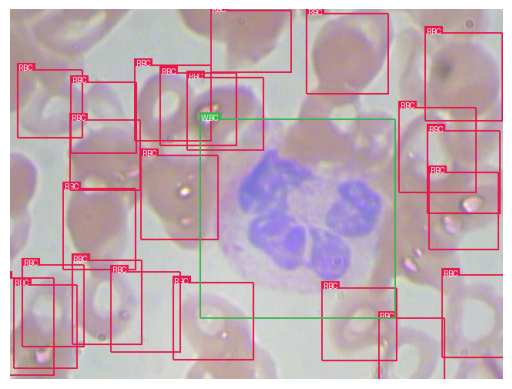

In [2]:
import torch
from torch.utils.data import Dataset
import json
import os
import matplotlib.pyplot as plt
import numpy as np
from torchvision import transforms
from tqdm import tqdm
from pprint import PrettyPrinter
from torch import nn
import torch.nn.functional as F
from math import sqrt
from itertools import product as product
import torchvision
import time
import torch.backends.cudnn as cudnn
import torch.optim
import torch.utils.data
import random
import xml.etree.ElementTree as ET
import torchvision.transforms.functional as FT
from sklearn.metrics import precision_recall_curve, average_precision_score
from PIL import Image, ImageDraw, ImageFont  # Add ImageDraw and ImageFont here


# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# # Проверим содержимое первого XML-файла
# sample_xml_path = os.path.join('BCCD_Dataset/BCCD/Annotations', 'BloodImage_00000.xml')
# with open(sample_xml_path, 'r') as f:
#     print(f.read())

# Check dataset structure
dataset_path = 'BCCD_Dataset/BCCD'
print("Checking dataset structure...")
print(f"Annotations exist: {os.path.exists(os.path.join(dataset_path, 'Annotations'))}")
print(f"JPEGImages exist: {os.path.exists(os.path.join(dataset_path, 'JPEGImages'))}")
print(f"ImageSets exist: {os.path.exists(os.path.join(dataset_path, 'ImageSets/Main'))}")

# Check the created JSON files
output_folder = 'BCCD_Dataset/BCCD'
print("\nChecking created JSON files...")
json_files = ['TRAIN_images.json', 'TRAIN_objects.json', 'TEST_images.json', 'TEST_objects.json']
for file in json_files:
    path = os.path.join(output_folder, file)
    print(f"{file} exists: {os.path.exists(path)}")
    if os.path.exists(path):
        with open(path, 'r') as f:
            data = json.load(f)
            print(f"  Contains {len(data)} items")




# Class labels for BCCD - Corrected to match your dataset
voc_labels = ('RBC', 'WBC', 'Platelets')  # Note: Your XML shows 'Platelets' but annotation shows 'Platelets' - ensure consistency
label_map = {k: v + 1 for v, k in enumerate(voc_labels)}
label_map['background'] = 0
rev_label_map = {v: k for k, v in label_map.items()}  # Inverse mapping

# Colors for bounding boxes
distinct_colors = ['#e6194b', '#3cb44b', '#ffe119']
label_color_map = {k: distinct_colors[i] for i, k in enumerate(voc_labels)}






class PascalVOCDataset(Dataset):
    """A PyTorch Dataset class to be used in a PyTorch DataLoader to create batches."""
    def __init__(self, data_folder, split, keep_difficult=False):
        """
        :param data_folder: folder where data files are stored
        :param split: split, one of 'TRAIN' or 'TEST'
        :param keep_difficult: keep or discard objects that are considered difficult to detect?
        """
        self.split = split.upper()
        assert self.split in {'TRAIN', 'TEST'}

        self.data_folder = data_folder
        self.keep_difficult = keep_difficult

        # Read data files
        with open(os.path.join(data_folder, self.split + '_images.json'), 'r') as j:
            self.images = json.load(j)
        with open(os.path.join(data_folder, self.split + '_objects.json'), 'r') as j:
            self.objects = json.load(j)

        assert len(self.images) == len(self.objects)

    def __getitem__(self, i):
        # Read image
        image = Image.open(self.images[i], mode='r')
        image = image.convert('RGB')

        # Read objects in this image (bounding boxes, labels, difficulties)
        objects = self.objects[i]
        boxes = torch.FloatTensor(objects['boxes'])  # (n_objects, 4)
        labels = torch.LongTensor(objects['labels'])  # (n_objects)
        difficulties = torch.ByteTensor(objects['difficulties'])  # (n_objects)

        # Discard difficult objects, if desired
        if not self.keep_difficult:
            boxes = boxes[1 - difficulties]
            labels = labels[1 - difficulties]
            difficulties = difficulties[1 - difficulties]

        # Apply transformations
        image, boxes, labels, difficulties = transform(image, boxes, labels, difficulties, split=self.split)

        return image, boxes, labels, difficulties

    def __len__(self):
        return len(self.images)

    def collate_fn(self, batch):
        """
        Since each image may have a different number of objects, we need a collate function.
        This describes how to combine these tensors of different sizes. We use lists.
        """
        images = list()
        boxes = list()
        labels = list()
        difficulties = list()

        for b in batch:
            images.append(b[0])
            boxes.append(b[1])
            labels.append(b[2])
            difficulties.append(b[3])

        images = torch.stack(images, dim=0)

        return images, boxes, labels, difficulties

def parse_annotation(annotation_path):
    """Parse XML annotation and return objects with correct label mapping."""
    tree = ET.parse(annotation_path)
    root = tree.getroot()

    boxes = list()
    labels = list()
    difficulties = list()
    
    for obj in root.iter('object'):
        difficult = int(obj.find('difficult').text == '1')
        label = obj.find('name').text.strip()  # Get the raw label text
        
        # Map the label to our standardized labels
        if label == 'Platelets':  # Handle any case inconsistencies
            label = 'Platelets'
        elif label not in label_map:
            continue  # Skip unknown labels

        bbox = obj.find('bndbox')
        xmin = int(float(bbox.find('xmin').text))  # Handle potential float values
        ymin = int(float(bbox.find('ymin').text))
        xmax = int(float(bbox.find('xmax').text))
        ymax = int(float(bbox.find('ymax').text))

        # Ensure coordinates are valid
        if xmin >= xmax or ymin >= ymax:
            continue

        boxes.append([xmin, ymin, xmax, ymax])
        labels.append(label_map[label])
        difficulties.append(difficult)

    return {'boxes': boxes, 'labels': labels, 'difficulties': difficulties}
def create_data_lists(dataset_path, output_folder):
    """Create lists of images, bounding boxes and labels, and save these to file."""
    # Create output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)
    
    # Verify dataset structure
    required_folders = ['Annotations', 'JPEGImages', 'ImageSets/Main']
    for folder in required_folders:
        if not os.path.exists(os.path.join(dataset_path, folder)):
            raise FileNotFoundError(f"Required folder not found: {os.path.join(dataset_path, folder)}")

    # Paths to the image sets
    trainval_path = os.path.join(dataset_path, 'ImageSets/Main/trainval.txt')
    test_path = os.path.join(dataset_path, 'ImageSets/Main/test.txt')
    
    if not os.path.exists(trainval_path):
        raise FileNotFoundError(f"trainval.txt not found at {trainval_path}")
    if not os.path.exists(test_path):
        raise FileNotFoundError(f"test.txt not found at {test_path}")

    # Read image IDs - ensure they match exactly with filenames
    def read_ids(filepath):
        with open(filepath) as f:
            return [line.strip() for line in f.readlines() if line.strip()]
    
    trainval_ids = read_ids(trainval_path)
    test_ids = read_ids(test_path)

    # Training data
    train_images = []
    train_objects = []
    n_objects = 0

    print("\nProcessing training data...")
    for img_id in tqdm(trainval_ids):
        # Verify annotation file exists
        annotation_path = os.path.join(dataset_path, 'Annotations', f"{img_id}.xml")
        if not os.path.exists(annotation_path):
            print(f"  Warning: Annotation not found for {img_id}, skipping")
            continue
            
        # Parse annotation
        try:
            objects = parse_annotation(annotation_path)
            if len(objects['boxes']) == 0:
                print(f"  Warning: No valid objects found in {img_id}, skipping")
                continue
        except Exception as e:
            print(f"  Warning: Error parsing {annotation_path}: {str(e)}, skipping")
            continue
            
        # Verify image file exists
        image_path = os.path.join(dataset_path, 'JPEGImages', f"{img_id}.jpg")
        if not os.path.exists(image_path):
            print(f"  Warning: Image not found for {img_id}, skipping")
            continue
            
        n_objects += len(objects['boxes'])
        train_objects.append(objects)
        train_images.append(image_path)

    # Test data
    test_images = []
    test_objects = []
    n_test_objects = 0

    print("\nProcessing test data...")
    for img_id in tqdm(test_ids):
        annotation_path = os.path.join(dataset_path, 'Annotations', f"{img_id}.xml")
        if not os.path.exists(annotation_path):
            print(f"  Warning: Annotation not found for {img_id}, skipping")
            continue
            
        try:
            objects = parse_annotation(annotation_path)
            if len(objects['boxes']) == 0:
                print(f"  Warning: No valid objects found in {img_id}, skipping")
                continue
        except Exception as e:
            print(f"  Warning: Error parsing {annotation_path}: {str(e)}, skipping")
            continue
            
        image_path = os.path.join(dataset_path, 'JPEGImages', f"{img_id}.jpg")
        if not os.path.exists(image_path):
            print(f"  Warning: Image not found for {img_id}, skipping")
            continue
            
        n_test_objects += len(objects['boxes'])
        test_objects.append(objects)
        test_images.append(image_path)

    # Save to file
    def save_json(data, filename):
        with open(os.path.join(output_folder, filename), 'w') as f:
            json.dump(data, f)
    
    save_json(train_images, 'TRAIN_images.json')
    save_json(train_objects, 'TRAIN_objects.json')
    save_json(test_images, 'TEST_images.json')
    save_json(test_objects, 'TEST_objects.json')
    save_json(label_map, 'label_map.json')

    print("\nSummary:")
    print(f"Training images: {len(train_images)}")
    print(f"Training objects: {n_objects}")
    print(f"Test images: {len(test_images)}")
    print(f"Test objects: {n_test_objects}")
    print(f"Files saved to: {os.path.abspath(output_folder)}")

# Helper functions for data augmentation and transformations
def expand(image, boxes, filler):
    """Zoom out operation by placing image in larger canvas of filler material."""
    original_h = image.size(1)
    original_w = image.size(2)
    max_scale = 4
    scale = random.uniform(1, max_scale)
    new_h = int(scale * original_h)
    new_w = int(scale * original_w)

    filler = torch.FloatTensor(filler)
    new_image = torch.ones((3, new_h, new_w), dtype=torch.float) * filler.unsqueeze(1).unsqueeze(1)

    left = random.randint(0, new_w - original_w)
    right = left + original_w
    top = random.randint(0, new_h - original_h)
    bottom = top + original_h
    new_image[:, top:bottom, left:right] = image

    new_boxes = boxes + torch.FloatTensor([left, top, left, top]).unsqueeze(0)
    return new_image, new_boxes

def random_crop(image, boxes, labels, difficulties):
    """Performs a random crop in the manner stated in the paper."""
    original_h = image.size(1)
    original_w = image.size(2)
    
    while True:
        min_overlap = random.choice([0., .1, .3, .5, .7, .9, None])
        if min_overlap is None:
            return image, boxes, labels, difficulties

        max_trials = 50
        for _ in range(max_trials):
            min_scale = 0.3
            scale_h = random.uniform(min_scale, 1)
            scale_w = random.uniform(min_scale, 1)
            new_h = int(scale_h * original_h)
            new_w = int(scale_w * original_w)

            aspect_ratio = new_h / new_w
            if not 0.5 < aspect_ratio < 2:
                continue

            left = random.randint(0, original_w - new_w)
            right = left + new_w
            top = random.randint(0, original_h - new_h)
            bottom = top + new_h
            crop = torch.FloatTensor([left, top, right, bottom])

            overlap = find_jaccard_overlap(crop.unsqueeze(0), boxes)
            overlap = overlap.squeeze(0)

            if overlap.max().item() < min_overlap:
                continue

            new_image = image[:, top:bottom, left:right]

            bb_centers = (boxes[:, :2] + boxes[:, 2:]) / 2.
            centers_in_crop = (bb_centers[:, 0] > left) * (bb_centers[:, 0] < right) * \
                             (bb_centers[:, 1] > top) * (bb_centers[:, 1] < bottom)

            if not centers_in_crop.any():
                continue

            new_boxes = boxes[centers_in_crop, :]
            new_labels = labels[centers_in_crop]
            new_difficulties = difficulties[centers_in_crop]

            new_boxes[:, :2] = torch.max(new_boxes[:, :2], crop[:2])
            new_boxes[:, :2] -= crop[:2]
            new_boxes[:, 2:] = torch.min(new_boxes[:, 2:], crop[2:])
            new_boxes[:, 2:] -= crop[:2]

            return new_image, new_boxes, new_labels, new_difficulties

def flip(image, boxes):
    """Flip image horizontally."""
    new_image = FT.hflip(image)
    new_boxes = boxes
    new_boxes[:, 0] = image.width - boxes[:, 0] - 1
    new_boxes[:, 2] = image.width - boxes[:, 2] - 1
    new_boxes = new_boxes[:, [2, 1, 0, 3]]
    return new_image, new_boxes

def photometric_distort(image):
    """Distort brightness, contrast, saturation, and hue, each with 50% chance."""
    new_image = image
    distortions = [FT.adjust_brightness, FT.adjust_contrast, 
                   FT.adjust_saturation, FT.adjust_hue]
    random.shuffle(distortions)

    for d in distortions:
        if random.random() < 0.5:
            if d.__name__ == 'adjust_hue':
                adjust_factor = random.uniform(-18 / 255., 18 / 255.)
            else:
                adjust_factor = random.uniform(0.5, 1.5)
            new_image = d(new_image, adjust_factor)
    return new_image

def transform(image, boxes, labels, difficulties, split):
    """Apply transformations to image and bounding boxes."""
    assert split in {'TRAIN', 'TEST'}
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]

    new_image = image
    new_boxes = boxes
    new_labels = labels
    new_difficulties = difficulties
    
    if split == 'TRAIN':
        # Apply photometric distortions
        new_image = photometric_distort(new_image)
        new_image = FT.to_tensor(new_image)

        # Expand image with 50% chance
        if random.random() < 0.5:
            new_image, new_boxes = expand(new_image, boxes, filler=mean)

        # Random crop
        new_image, new_boxes, new_labels, new_difficulties = random_crop(
            new_image, new_boxes, new_labels, new_difficulties)
        
        new_image = FT.to_pil_image(new_image)

        # Flip with 50% chance
        if random.random() < 0.5:
            new_image, new_boxes = flip(new_image, new_boxes)

    # Resize to (300, 300)
    new_image, new_boxes = resize(new_image, new_boxes, dims=(300, 300))
    new_image = FT.to_tensor(new_image)
    new_image = FT.normalize(new_image, mean=mean, std=std)

    return new_image, new_boxes, new_labels, new_difficulties

def resize(image, boxes, dims=(300, 300), return_percent_coords=True):
    """Resize image and adjust bounding boxes."""
    new_image = FT.resize(image, dims)
    old_dims = torch.FloatTensor([image.width, image.height, image.width, image.height]).unsqueeze(0)
    new_boxes = boxes / old_dims
    
    if not return_percent_coords:
        new_dims = torch.FloatTensor([dims[1], dims[0], dims[1], dims[0]]).unsqueeze(0)
        new_boxes = new_boxes * new_dims
    
    return new_image, new_boxes

def find_jaccard_overlap(set_1, set_2):
    """Calculate Jaccard Overlap (IoU) between two sets of boxes."""
    intersection = find_intersection(set_1, set_2)
    areas_set_1 = (set_1[:, 2] - set_1[:, 0]) * (set_1[:, 3] - set_1[:, 1])
    areas_set_2 = (set_2[:, 2] - set_2[:, 0]) * (set_2[:, 3] - set_2[:, 1])
    union = areas_set_1.unsqueeze(1) + areas_set_2.unsqueeze(0) - intersection
    return intersection / union

def find_intersection(set_1, set_2):
    """Find intersection of every box combination between two sets of boxes."""
    lower_bounds = torch.max(set_1[:, :2].unsqueeze(1), set_2[:, :2].unsqueeze(0))
    upper_bounds = torch.min(set_1[:, 2:].unsqueeze(1), set_2[:, 2:].unsqueeze(0))
    intersection_dims = torch.clamp(upper_bounds - lower_bounds, min=0)
    return intersection_dims[:, :, 0] * intersection_dims[:, :, 1]

def xy_to_cxcy(xy):
    """Convert boundary coordinates to center-size coordinates."""
    return torch.cat([(xy[:, 2:] + xy[:, :2]) / 2, xy[:, 2:] - xy[:, :2]], 1)

def cxcy_to_xy(cxcy):
    """Convert center-size coordinates to boundary coordinates."""
    return torch.cat([cxcy[:, :2] - (cxcy[:, 2:] / 2), cxcy[:, :2] + (cxcy[:, 2:] / 2)], 1)

def cxcy_to_gcxgcy(cxcy, priors_cxcy):
    """Encode bounding boxes for the model."""
    return torch.cat([(cxcy[:, :2] - priors_cxcy[:, :2]) / (priors_cxcy[:, 2:] / 10),
                     torch.log(cxcy[:, 2:] / priors_cxcy[:, 2:]) * 5], 1)

def gcxgcy_to_cxcy(gcxgcy, priors_cxcy):
    """Decode bounding boxes from model output."""
    return torch.cat([gcxgcy[:, :2] * priors_cxcy[:, 2:] / 10 + priors_cxcy[:, :2],
                     torch.exp(gcxgcy[:, 2:] / 5) * priors_cxcy[:, 2:]], 1)

# SSD300 Model Components
class VGGBase(nn.Module):
    """VGG base convolutions to produce lower-level feature maps."""
    def __init__(self):
        super(VGGBase, self).__init__()
        
        # Standard convolutional layers in VGG16
        self.conv1_1 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.conv1_2 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv2_1 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv2_2 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv3_1 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.conv3_2 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.conv3_3 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2, ceil_mode=True)

        self.conv4_1 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.conv4_2 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv4_3 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv5_1 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv5_2 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv5_3 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.pool5 = nn.MaxPool2d(kernel_size=3, stride=1, padding=1)

        # Replacements for FC6 and FC7 in VGG16
        self.conv6 = nn.Conv2d(512, 1024, kernel_size=3, padding=6, dilation=6)
        self.conv7 = nn.Conv2d(1024, 1024, kernel_size=1)

        # Load pretrained layers
        self.load_pretrained_layers()

    def forward(self, image):
        out = F.relu(self.conv1_1(image))
        out = F.relu(self.conv1_2(out))
        out = self.pool1(out)

        out = F.relu(self.conv2_1(out))
        out = F.relu(self.conv2_2(out))
        out = self.pool2(out)

        out = F.relu(self.conv3_1(out))
        out = F.relu(self.conv3_2(out))
        out = F.relu(self.conv3_3(out))
        out = self.pool3(out)

        out = F.relu(self.conv4_1(out))
        out = F.relu(self.conv4_2(out))
        out = F.relu(self.conv4_3(out))
        conv4_3_feats = out
        out = self.pool4(out)

        out = F.relu(self.conv5_1(out))
        out = F.relu(self.conv5_2(out))
        out = F.relu(self.conv5_3(out))
        out = self.pool5(out)

        out = F.relu(self.conv6(out))
        conv7_feats = F.relu(self.conv7(out))

        return conv4_3_feats, conv7_feats

    def load_pretrained_layers(self):
        state_dict = self.state_dict()
        param_names = list(state_dict.keys())
        pretrained_state_dict = torchvision.models.vgg16(pretrained=True).state_dict()
        pretrained_param_names = list(pretrained_state_dict.keys())

        for i, param in enumerate(param_names[:-4]):
            state_dict[param] = pretrained_state_dict[pretrained_param_names[i]]

        # Convert fc6, fc7 to convolutional layers
        conv_fc6_weight = pretrained_state_dict['classifier.0.weight'].view(4096, 512, 7, 7)
        conv_fc6_bias = pretrained_state_dict['classifier.0.bias']
        state_dict['conv6.weight'] = decimate(conv_fc6_weight, m=[4, None, 3, 3])
        state_dict['conv6.bias'] = decimate(conv_fc6_bias, m=[4])

        conv_fc7_weight = pretrained_state_dict['classifier.3.weight'].view(4096, 4096, 1, 1)
        conv_fc7_bias = pretrained_state_dict['classifier.3.bias']
        state_dict['conv7.weight'] = decimate(conv_fc7_weight, m=[4, 4, None, None])
        state_dict['conv7.bias'] = decimate(conv_fc7_bias, m=[4])

        self.load_state_dict(state_dict)
        print("\nLoaded base model.\n")

def decimate(tensor, m):
    """Decimate tensor by factor 'm' (downsample by keeping every 'm'th value)."""
    assert tensor.dim() == len(m)
    for d in range(tensor.dim()):
        if m[d] is not None:
            tensor = tensor.index_select(dim=d,
                                       index=torch.arange(start=0, end=tensor.size(d), step=m[d]).long())
    return tensor

class AuxiliaryConvolutions(nn.Module):
    """Additional convolutions to produce higher-level feature maps."""
    def __init__(self):
        super(AuxiliaryConvolutions, self).__init__()
        
        self.conv8_1 = nn.Conv2d(1024, 256, kernel_size=1, padding=0)
        self.conv8_2 = nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1)

        self.conv9_1 = nn.Conv2d(512, 128, kernel_size=1, padding=0)
        self.conv9_2 = nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1)

        self.conv10_1 = nn.Conv2d(256, 128, kernel_size=1, padding=0)
        self.conv10_2 = nn.Conv2d(128, 256, kernel_size=3, padding=0)

        self.conv11_1 = nn.Conv2d(256, 128, kernel_size=1, padding=0)
        self.conv11_2 = nn.Conv2d(128, 256, kernel_size=3, padding=0)

        self.init_conv2d()

    def init_conv2d(self):
        """Initialize convolution parameters."""
        for c in self.children():
            if isinstance(c, nn.Conv2d):
                nn.init.xavier_uniform_(c.weight)
                nn.init.constant_(c.bias, 0.)

    def forward(self, conv7_feats):
        out = F.relu(self.conv8_1(conv7_feats))
        out = F.relu(self.conv8_2(out))
        conv8_2_feats = out

        out = F.relu(self.conv9_1(out))
        out = F.relu(self.conv9_2(out))
        conv9_2_feats = out

        out = F.relu(self.conv10_1(out))
        out = F.relu(self.conv10_2(out))
        conv10_2_feats = out

        out = F.relu(self.conv11_1(out))
        conv11_2_feats = F.relu(self.conv11_2(out))

        return conv8_2_feats, conv9_2_feats, conv10_2_feats, conv11_2_feats

class PredictionConvolutions(nn.Module):
    """Convolutions to predict class scores and bounding boxes."""
    def __init__(self, n_classes):
        super(PredictionConvolutions, self).__init__()
        self.n_classes = n_classes

        # Number of prior-boxes per feature map location
        n_boxes = {'conv4_3': 4, 'conv7': 6, 'conv8_2': 6,
                   'conv9_2': 6, 'conv10_2': 4, 'conv11_2': 4}

        # Localization prediction convolutions
        self.loc_conv4_3 = nn.Conv2d(512, n_boxes['conv4_3'] * 4, kernel_size=3, padding=1)
        self.loc_conv7 = nn.Conv2d(1024, n_boxes['conv7'] * 4, kernel_size=3, padding=1)
        self.loc_conv8_2 = nn.Conv2d(512, n_boxes['conv8_2'] * 4, kernel_size=3, padding=1)
        self.loc_conv9_2 = nn.Conv2d(256, n_boxes['conv9_2'] * 4, kernel_size=3, padding=1)
        self.loc_conv10_2 = nn.Conv2d(256, n_boxes['conv10_2'] * 4, kernel_size=3, padding=1)
        self.loc_conv11_2 = nn.Conv2d(256, n_boxes['conv11_2'] * 4, kernel_size=3, padding=1)

        # Class prediction convolutions
        self.cl_conv4_3 = nn.Conv2d(512, n_boxes['conv4_3'] * n_classes, kernel_size=3, padding=1)
        self.cl_conv7 = nn.Conv2d(1024, n_boxes['conv7'] * n_classes, kernel_size=3, padding=1)
        self.cl_conv8_2 = nn.Conv2d(512, n_boxes['conv8_2'] * n_classes, kernel_size=3, padding=1)
        self.cl_conv9_2 = nn.Conv2d(256, n_boxes['conv9_2'] * n_classes, kernel_size=3, padding=1)
        self.cl_conv10_2 = nn.Conv2d(256, n_boxes['conv10_2'] * n_classes, kernel_size=3, padding=1)
        self.cl_conv11_2 = nn.Conv2d(256, n_boxes['conv11_2'] * n_classes, kernel_size=3, padding=1)

        self.init_conv2d()

    def init_conv2d(self):
        """Initialize convolution parameters."""
        for c in self.children():
            if isinstance(c, nn.Conv2d):
                nn.init.xavier_uniform_(c.weight)
                nn.init.constant_(c.bias, 0.)

    def forward(self, conv4_3_feats, conv7_feats, conv8_2_feats, conv9_2_feats, conv10_2_feats, conv11_2_feats):
        batch_size = conv4_3_feats.size(0)

        # Predict localization boxes' bounds
        l_conv4_3 = self.loc_conv4_3(conv4_3_feats)
        l_conv4_3 = l_conv4_3.permute(0, 2, 3, 1).contiguous()
        l_conv4_3 = l_conv4_3.view(batch_size, -1, 4)

        l_conv7 = self.loc_conv7(conv7_feats)
        l_conv7 = l_conv7.permute(0, 2, 3, 1).contiguous()
        l_conv7 = l_conv7.view(batch_size, -1, 4)

        l_conv8_2 = self.loc_conv8_2(conv8_2_feats)
        l_conv8_2 = l_conv8_2.permute(0, 2, 3, 1).contiguous()
        l_conv8_2 = l_conv8_2.view(batch_size, -1, 4)

        l_conv9_2 = self.loc_conv9_2(conv9_2_feats)
        l_conv9_2 = l_conv9_2.permute(0, 2, 3, 1).contiguous()
        l_conv9_2 = l_conv9_2.view(batch_size, -1, 4)

        l_conv10_2 = self.loc_conv10_2(conv10_2_feats)
        l_conv10_2 = l_conv10_2.permute(0, 2, 3, 1).contiguous()
        l_conv10_2 = l_conv10_2.view(batch_size, -1, 4)

        l_conv11_2 = self.loc_conv11_2(conv11_2_feats)
        l_conv11_2 = l_conv11_2.permute(0, 2, 3, 1).contiguous()
        l_conv11_2 = l_conv11_2.view(batch_size, -1, 4)

        # Predict classes in localization boxes
        c_conv4_3 = self.cl_conv4_3(conv4_3_feats)
        c_conv4_3 = c_conv4_3.permute(0, 2, 3, 1).contiguous()
        c_conv4_3 = c_conv4_3.view(batch_size, -1, self.n_classes)

        c_conv7 = self.cl_conv7(conv7_feats)
        c_conv7 = c_conv7.permute(0, 2, 3, 1).contiguous()
        c_conv7 = c_conv7.view(batch_size, -1, self.n_classes)

        c_conv8_2 = self.cl_conv8_2(conv8_2_feats)
        c_conv8_2 = c_conv8_2.permute(0, 2, 3, 1).contiguous()
        c_conv8_2 = c_conv8_2.view(batch_size, -1, self.n_classes)

        c_conv9_2 = self.cl_conv9_2(conv9_2_feats)
        c_conv9_2 = c_conv9_2.permute(0, 2, 3, 1).contiguous()
        c_conv9_2 = c_conv9_2.view(batch_size, -1, self.n_classes)

        c_conv10_2 = self.cl_conv10_2(conv10_2_feats)
        c_conv10_2 = c_conv10_2.permute(0, 2, 3, 1).contiguous()
        c_conv10_2 = c_conv10_2.view(batch_size, -1, self.n_classes)

        c_conv11_2 = self.cl_conv11_2(conv11_2_feats)
        c_conv11_2 = c_conv11_2.permute(0, 2, 3, 1).contiguous()
        c_conv11_2 = c_conv11_2.view(batch_size, -1, self.n_classes)

        # Concatenate in specific order
        locs = torch.cat([l_conv4_3, l_conv7, l_conv8_2, l_conv9_2, l_conv10_2, l_conv11_2], dim=1)
        classes_scores = torch.cat([c_conv4_3, c_conv7, c_conv8_2, c_conv9_2, c_conv10_2, c_conv11_2], dim=1)

        return locs, classes_scores

class SSD300(nn.Module):
    """The SSD300 network - encapsulates base VGG network, auxiliary, and prediction convolutions."""
    def __init__(self, n_classes):
        super(SSD300, self).__init__()
        self.n_classes = n_classes
        self.base = VGGBase()
        self.aux_convs = AuxiliaryConvolutions()
        self.pred_convs = PredictionConvolutions(n_classes)

        # Rescale factor for conv4_3 features
        self.rescale_factors = nn.Parameter(torch.FloatTensor(1, 512, 1, 1))
        nn.init.constant_(self.rescale_factors, 20)

        # Prior boxes
        self.priors_cxcy = self.create_prior_boxes()

    def forward(self, image):
        # Run VGG base network
        conv4_3_feats, conv7_feats = self.base(image)

        # Rescale conv4_3 after L2 norm
        norm = conv4_3_feats.pow(2).sum(dim=1, keepdim=True).sqrt()
        conv4_3_feats = conv4_3_feats / norm
        conv4_3_feats = conv4_3_feats * self.rescale_factors

        # Run auxiliary convolutions
        conv8_2_feats, conv9_2_feats, conv10_2_feats, conv11_2_feats = self.aux_convs(conv7_feats)

        # Run prediction convolutions
        locs, classes_scores = self.pred_convs(conv4_3_feats, conv7_feats, conv8_2_feats, 
                                              conv9_2_feats, conv10_2_feats, conv11_2_feats)

        return locs, classes_scores

    def create_prior_boxes(self):
        """Create the 8732 prior (default) boxes for the SSD300."""
        fmap_dims = {'conv4_3': 38, 'conv7': 19, 'conv8_2': 10,
                     'conv9_2': 5, 'conv10_2': 3, 'conv11_2': 1}

        obj_scales = {'conv4_3': 0.1, 'conv7': 0.2, 'conv8_2': 0.375,
                      'conv9_2': 0.55, 'conv10_2': 0.725, 'conv11_2': 0.9}

        aspect_ratios = {'conv4_3': [1., 2., 0.5],
                         'conv7': [1., 2., 3., 0.5, .333],
                         'conv8_2': [1., 2., 3., 0.5, .333],
                         'conv9_2': [1., 2., 3., 0.5, .333],
                         'conv10_2': [1., 2., 0.5],
                         'conv11_2': [1., 2., 0.5]}

        fmaps = list(fmap_dims.keys())
        prior_boxes = []

        for k, fmap in enumerate(fmaps):
            for i in range(fmap_dims[fmap]):
                for j in range(fmap_dims[fmap]):
                    cx = (j + 0.5) / fmap_dims[fmap]
                    cy = (i + 0.5) / fmap_dims[fmap]

                    for ratio in aspect_ratios[fmap]:
                        prior_boxes.append([cx, cy, obj_scales[fmap] * sqrt(ratio), obj_scales[fmap] / sqrt(ratio)])

                        if ratio == 1.:
                            try:
                                additional_scale = sqrt(obj_scales[fmap] * obj_scales[fmaps[k + 1]])
                            except IndexError:
                                additional_scale = 1.
                            prior_boxes.append([cx, cy, additional_scale, additional_scale])

        prior_boxes = torch.FloatTensor(prior_boxes).to(device)
        prior_boxes.clamp_(0, 1)
        return prior_boxes

    def detect_objects(self, predicted_locs, predicted_scores, min_score, max_overlap, top_k):
        """Decipher model output to detect objects."""
        batch_size = predicted_locs.size(0)
        n_priors = self.priors_cxcy.size(0)
        predicted_scores = F.softmax(predicted_scores, dim=2)

        all_images_boxes = list()
        all_images_labels = list()
        all_images_scores = list()

        for i in range(batch_size):
            decoded_locs = cxcy_to_xy(
                gcxgcy_to_cxcy(predicted_locs[i], self.priors_cxcy))

            image_boxes = list()
            image_labels = list()
            image_scores = list()

            max_scores, best_label = predicted_scores[i].max(dim=1)

            for c in range(1, self.n_classes):
                class_scores = predicted_scores[i][:, c]
                score_above_min_score = class_scores > min_score
                n_above_min_score = score_above_min_score.sum().item()
                if n_above_min_score == 0:
                    continue
                
                class_scores = class_scores[score_above_min_score]
                class_decoded_locs = decoded_locs[score_above_min_score]

                class_scores, sort_ind = class_scores.sort(dim=0, descending=True)
                class_decoded_locs = class_decoded_locs[sort_ind]

                overlap = find_jaccard_overlap(class_decoded_locs, class_decoded_locs)
                suppress = torch.zeros((n_above_min_score), dtype=torch.uint8).to(device)

                for box in range(class_decoded_locs.size(0)):
                    if suppress[box] == 1:
                        continue
                    suppress = torch.max(suppress, overlap[box] > max_overlap)
                    suppress[box] = 0

                image_boxes.append(class_decoded_locs[1 - suppress])
                image_labels.append(torch.LongTensor((1 - suppress).sum().item() * [c]).to(device))
                image_scores.append(class_scores[1 - suppress])

            if len(image_boxes) == 0:
                image_boxes.append(torch.FloatTensor([[0., 0., 1., 1.]]).to(device))
                image_labels.append(torch.LongTensor([0]).to(device))
                image_scores.append(torch.FloatTensor([0.]).to(device))

            image_boxes = torch.cat(image_boxes, dim=0)
            image_labels = torch.cat(image_labels, dim=0)
            image_scores = torch.cat(image_scores, dim=0)
            n_objects = image_scores.size(0)

            if n_objects > top_k:
                image_scores, sort_ind = image_scores.sort(dim=0, descending=True)
                image_scores = image_scores[:top_k]
                image_boxes = image_boxes[sort_ind][:top_k]
                image_labels = image_labels[sort_ind][:top_k]

            all_images_boxes.append(image_boxes)
            all_images_labels.append(image_labels)
            all_images_scores.append(image_scores)

        return all_images_boxes, all_images_labels, all_images_scores

class MultiBoxLoss(nn.Module):
    """The MultiBox loss for object detection."""
    def __init__(self, priors_cxcy, threshold=0.5, neg_pos_ratio=3, alpha=1.):
        super(MultiBoxLoss, self).__init__()
        self.priors_cxcy = priors_cxcy
        self.priors_xy = cxcy_to_xy(priors_cxcy)
        self.threshold = threshold
        self.neg_pos_ratio = neg_pos_ratio
        self.alpha = alpha

        self.smooth_l1 = nn.L1Loss()
        self.cross_entropy = nn.CrossEntropyLoss(reduce=False)

    def forward(self, predicted_locs, predicted_scores, boxes, labels):
        batch_size = predicted_locs.size(0)
        n_priors = self.priors_cxcy.size(0)
        n_classes = predicted_scores.size(2)

        true_locs = torch.zeros((batch_size, n_priors, 4), dtype=torch.float).to(device)
        true_classes = torch.zeros((batch_size, n_priors), dtype=torch.long).to(device)

        for i in range(batch_size):
            n_objects = boxes[i].size(0)
            if n_objects == 0:
                continue

            overlap = find_jaccard_overlap(boxes[i], self.priors_xy)
            overlap_for_each_prior, object_for_each_prior = overlap.max(dim=0)

            _, prior_for_each_object = overlap.max(dim=1)
            object_for_each_prior[prior_for_each_object] = torch.LongTensor(range(n_objects)).to(device)
            overlap_for_each_prior[prior_for_each_object] = 1.

            label_for_each_prior = labels[i][object_for_each_prior]
            label_for_each_prior[overlap_for_each_prior < self.threshold] = 0

            true_classes[i] = label_for_each_prior
            true_locs[i] = cxcy_to_gcxgcy(xy_to_cxcy(boxes[i][object_for_each_prior]), self.priors_cxcy)

        positive_priors = true_classes != 0

        # LOCALIZATION LOSS
        loc_loss = self.smooth_l1(predicted_locs[positive_priors], true_locs[positive_priors])

        # CONFIDENCE LOSS
        n_positives = positive_priors.sum(dim=1)
        n_hard_negatives = self.neg_pos_ratio * n_positives

        conf_loss_all = self.cross_entropy(predicted_scores.view(-1, n_classes), true_classes.view(-1))
        conf_loss_all = conf_loss_all.view(batch_size, n_priors)

        conf_loss_pos = conf_loss_all[positive_priors]

        conf_loss_neg = conf_loss_all.clone()
        conf_loss_neg[positive_priors] = 0.
        conf_loss_neg, _ = conf_loss_neg.sort(dim=1, descending=True)
        hardness_ranks = torch.LongTensor(range(n_priors)).unsqueeze(0).expand_as(conf_loss_neg).to(device)
        hard_negatives = hardness_ranks < n_hard_negatives.unsqueeze(1)
        conf_loss_hard_neg = conf_loss_neg[hard_negatives]

        conf_loss = (conf_loss_hard_neg.sum() + conf_loss_pos.sum()) / n_positives.sum().float()

        return conf_loss + self.alpha * loc_loss

def train(train_loader, model, criterion, optimizer, epoch):
    """One epoch's training."""
    model.train()
    batch_time = AverageMeter()
    data_time = AverageMeter()
    losses = AverageMeter()
    start = time.time()

    for i, (images, boxes, labels, _) in enumerate(train_loader):
        data_time.update(time.time() - start)
        images = images.to(device)
        boxes = [b.to(device) for b in boxes]
        labels = [l.to(device) for l in labels]

        predicted_locs, predicted_scores = model(images)
        loss = criterion(predicted_locs, predicted_scores, boxes, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        losses.update(loss.item(), images.size(0))
        batch_time.update(time.time() - start)
        start = time.time()

        if i % 200 == 0:
            print('Epoch: [{0}][{1}/{2}]\t'
                  'Batch Time {batch_time.val:.3f} ({batch_time.avg:.3f})\t'
                  'Data Time {data_time.val:.3f} ({data_time.avg:.3f})\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'.format(
                   epoch, i, len(train_loader), batch_time=batch_time,
                   data_time=data_time, loss=losses))

def evaluate(test_loader, model):
    """Evaluate model on test set."""
    model.eval()
    det_boxes = list()
    det_labels = list()
    det_scores = list()
    true_boxes = list()
    true_labels = list()
    true_difficulties = list()

    with torch.no_grad():
        for images, boxes, labels, difficulties in tqdm(test_loader, desc='Evaluating'):
            images = images.to(device)
            boxes = [b.to(device) for b in boxes]
            labels = [l.to(device) for l in labels]
            difficulties = [d.to(device) for d in difficulties]

            predicted_locs, predicted_scores = model(images)
            det_boxes_batch, det_labels_batch, det_scores_batch = model.detect_objects(
                predicted_locs, predicted_scores, min_score=0.01, max_overlap=0.45, top_k=200)

            det_boxes.extend(det_boxes_batch)
            det_labels.extend(det_labels_batch)
            det_scores.extend(det_scores_batch)
            true_boxes.extend(boxes)
            true_labels.extend(labels)
            true_difficulties.extend(difficulties)

        APs, mAP = calculate_mAP(det_boxes, det_labels, det_scores, 
                                true_boxes, true_labels, true_difficulties)

    pp = PrettyPrinter()
    pp.pprint(APs)
    print('\nMean Average Precision (mAP): %.3f' % mAP)

def calculate_mAP(det_boxes, det_labels, det_scores, true_boxes, true_labels, true_difficulties):
    """Calculate Mean Average Precision (mAP)."""
    n_classes = len(label_map)
    true_images = list()
    for i in range(len(true_labels)):
        true_images.extend([i] * true_labels[i].size(0))
    true_images = torch.LongTensor(true_images).to(device)
    true_boxes = torch.cat(true_boxes, dim=0).to(device)
    true_labels = torch.cat(true_labels, dim=0).to(device)
    true_difficulties = torch.cat(true_difficulties, dim=0).to(device)

    det_images = list()
    for i in range(len(det_labels)):
        det_images.extend([i] * det_labels[i].size(0))
    det_images = torch.LongTensor(det_images).to(device)
    det_boxes = torch.cat(det_boxes, dim=0).to(device)
    det_labels = torch.cat(det_labels, dim=0).to(device)
    det_scores = torch.cat(det_scores, dim=0).to(device)

    average_precisions = torch.zeros((n_classes - 1), dtype=torch.float).to(device)
    
    for c in range(1, n_classes):
        true_class_images = true_images[true_labels == c]
        true_class_boxes = true_boxes[true_labels == c]
        true_class_difficulties = true_difficulties[true_labels == c]
        n_easy_class_objects = (1 - true_class_difficulties).sum().item()

        true_class_boxes_detected = torch.zeros((true_class_difficulties.size(0)), dtype=torch.uint8).to(device)
        det_class_images = det_images[det_labels == c]
        det_class_boxes = det_boxes[det_labels == c]
        det_class_scores = det_scores[det_labels == c]
        n_class_detections = det_class_boxes.size(0)
        
        if n_class_detections == 0:
            continue

        det_class_scores, sort_ind = torch.sort(det_class_scores, dim=0, descending=True)
        det_class_images = det_class_images[sort_ind]
        det_class_boxes = det_class_boxes[sort_ind]

        true_positives = torch.zeros((n_class_detections), dtype=torch.float).to(device)
        false_positives = torch.zeros((n_class_detections), dtype=torch.float).to(device)

        for d in range(n_class_detections):
            this_detection_box = det_class_boxes[d].unsqueeze(0)
            this_image = det_class_images[d]

            object_boxes = true_class_boxes[true_class_images == this_image]
            object_difficulties = true_class_difficulties[true_class_images == this_image]
            
            if object_boxes.size(0) == 0:
                false_positives[d] = 1
                continue

            overlaps = find_jaccard_overlap(this_detection_box, object_boxes)
            max_overlap, ind = torch.max(overlaps.squeeze(0), dim=0)
            
            # Fix: Ensure we're using the same device for indexing
            matching_inds = (true_class_images == this_image).nonzero().squeeze(1)
            if matching_inds.numel() == 0:
                false_positives[d] = 1
                continue
                
            original_ind = matching_inds[ind]

            if max_overlap.item() > 0.5:
                if object_difficulties[ind] == 0:
                    if true_class_boxes_detected[original_ind] == 0:
                        true_positives[d] = 1
                        true_class_boxes_detected[original_ind] = 1
                    else:
                        false_positives[d] = 1
            else:
                false_positives[d] = 1

        cumul_true_positives = torch.cumsum(true_positives, dim=0)
        cumul_false_positives = torch.cumsum(false_positives, dim=0)
        cumul_precision = cumul_true_positives / (cumul_true_positives + cumul_false_positives + 1e-10)
        cumul_recall = cumul_true_positives / n_easy_class_objects

        recall_thresholds = torch.arange(start=0, end=1.1, step=.1).tolist()
        precisions = torch.zeros((len(recall_thresholds)), dtype=torch.float).to(device)
        for i, t in enumerate(recall_thresholds):
            recalls_above_t = cumul_recall >= t
            if recalls_above_t.any():
                precisions[i] = cumul_precision[recalls_above_t].max()
            else:
                precisions[i] = 0.
        average_precisions[c - 1] = precisions.mean()

    mean_average_precision = average_precisions.mean().item()
    average_precisions = {rev_label_map[c + 1]: v for c, v in enumerate(average_precisions.tolist())}
    return average_precisions, mean_average_precision

class AverageMeter(object):
    """Keeps track of most recent, average, sum, and count of a metric."""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

def save_checkpoint(epoch, model, optimizer):
    """Save model checkpoint."""
    state = {'epoch': epoch,
             'model': model,
             'optimizer': optimizer}
    filename = 'checkpoint_ssd300.pth.tar'
    torch.save(state, filename)

def adjust_learning_rate(optimizer, scale):
    """Scale learning rate by a specified factor."""
    for param_group in optimizer.param_groups:
        param_group['lr'] = param_group['lr'] * scale
    print("DECAYING learning rate.\n The new LR is %f\n" % (optimizer.param_groups[1]['lr'],))

def detect(original_image, min_score, max_overlap, top_k, suppress=None):
    """Detect objects in an image with a trained SSD300."""
    resize = transforms.Resize((300, 300))
    to_tensor = transforms.ToTensor()
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                    std=[0.229, 0.224, 0.225])

    image = normalize(to_tensor(resize(original_image)))
    image = image.to(device)

    predicted_locs, predicted_scores = model(image.unsqueeze(0))
    det_boxes, det_labels, det_scores = model.detect_objects(predicted_locs, predicted_scores, 
                                                            min_score=min_score, max_overlap=max_overlap, top_k=top_k)

    det_boxes = det_boxes[0].to('cpu')
    original_dims = torch.FloatTensor(
        [original_image.width, original_image.height, original_image.width, original_image.height]).unsqueeze(0)
    det_boxes = det_boxes * original_dims
    det_labels = [rev_label_map[l] for l in det_labels[0].to('cpu').tolist()]

    if det_labels == ['background']:
        return original_image

    annotated_image = original_image
    draw = ImageDraw.Draw(annotated_image)
    
    try:
        font = ImageFont.truetype("arial.ttf", 15)
    except:
        font = ImageFont.load_default()

    for i in range(det_boxes.size(0)):
        if suppress is not None:
            if det_labels[i] in suppress:
                continue

        box_location = det_boxes[i].tolist()
        draw.rectangle(xy=box_location, outline=label_color_map[det_labels[i]])
        draw.rectangle(xy=[l + 1. for l in box_location], outline=label_color_map[det_labels[i]])

        # Modern way to get text size in Pillow >= 9.0.0
        left, top, right, bottom = ImageDraw.Draw(annotated_image).textbbox(
            (0, 0), 
            det_labels[i].upper(), 
            font=font
        )
        text_width = right - left
        text_height = bottom - top
        
        text_location = [box_location[0] + 2., box_location[1] - text_height]
        textbox_location = [box_location[0], box_location[1] - text_height, 
                           box_location[0] + text_width + 4., box_location[1]]
        draw.rectangle(xy=textbox_location, fill=label_color_map[det_labels[i]])
        draw.text(xy=text_location, text=det_labels[i].upper(), fill='white', font=font)

    return annotated_image


def main():
    """Main training and evaluation pipeline."""
    global model, label_map, rev_label_map
    
    # First create the data lists
    try:
        create_data_lists(dataset_path='BCCD_Dataset/BCCD', output_folder='BCCD_Dataset/BCCD')
    except Exception as e:
        print(f"Error creating data lists: {e}")
        return

    # Data parameters
    data_folder = 'BCCD_Dataset/BCCD'  # folder with data files
    keep_difficult = True  # use objects considered difficult to detect?

    # Model parameters
    n_classes = len(label_map)  # number of different types of objects

    # Learning parameters
    checkpoint = None  # path to model checkpoint, None if none
    batch_size = 8  # batch size
    iterations = 3000  # number of iterations to train
    workers = 4  # number of workers for loading data in the DataLoader
    print_freq = 200  # print training status every __ batches
    lr = 1e-3  # learning rate
    decay_lr_at = [80000, 100000]  # decay learning rate after these many iterations
    decay_lr_to = 0.1  # decay learning rate to this fraction of the existing learning rate
    momentum = 0.9  # momentum
    weight_decay = 5e-4  # weight decay
    grad_clip = None  # clip if gradients are exploding

    cudnn.benchmark = True

    # Initialize model or load checkpoint
    if checkpoint is None:
        start_epoch = 0
        model = SSD300(n_classes=n_classes)
        
        biases = list()
        not_biases = list()
        for param_name, param in model.named_parameters():
            if param.requires_grad:
                if param_name.endswith('.bias'):
                    biases.append(param)
                else:
                    not_biases.append(param)
        optimizer = torch.optim.SGD(params=[{'params': biases, 'lr': 2 * lr}, {'params': not_biases}],
                                    lr=lr, momentum=momentum, weight_decay=weight_decay)
    else:
        checkpoint = torch.load(checkpoint)
        start_epoch = checkpoint['epoch'] + 1
        print('\nLoaded checkpoint from epoch %d.\n' % start_epoch)
        model = checkpoint['model']
        optimizer = checkpoint['optimizer']

    model = model.to(device)
    criterion = MultiBoxLoss(priors_cxcy=model.priors_cxcy).to(device)

    # Custom dataloaders
    try:
        train_dataset = PascalVOCDataset(data_folder, split='train', keep_difficult=keep_difficult)
        train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True,
                                                 collate_fn=train_dataset.collate_fn, num_workers=workers,
                                                 pin_memory=True)

        test_dataset = PascalVOCDataset(data_folder, split='test', keep_difficult=keep_difficult)
        test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False,
                                                collate_fn=test_dataset.collate_fn, num_workers=workers,
                                                pin_memory=True)
    except Exception as e:
        print(f"Error creating data loaders: {e}")
        return

    # Calculate total number of epochs to train
    epochs = iterations // (len(train_dataset) // batch_size)
    decay_lr_at = [it // (len(train_dataset) // batch_size) for it in decay_lr_at]

    # Epochs
    for epoch in range(start_epoch, epochs):
        if epoch in decay_lr_at:
            adjust_learning_rate(optimizer, decay_lr_to)

        train(train_loader=train_loader,
              model=model,
              criterion=criterion,
              optimizer=optimizer,
              epoch=epoch)

        save_checkpoint(epoch, model, optimizer)

        # Evaluate after each epoch
        evaluate(test_loader, model)

if __name__ == '__main__':
    main()
    
    # Example of detection on a single image
    img_path = 'BCCD_Dataset/BCCD/JPEGImages/BloodImage_00000.jpg'
    original_image = Image.open(img_path, mode='r')
    original_image = original_image.convert('RGB')
    result_image = detect(original_image, min_score=0.2, max_overlap=0.5, top_k=200)
    plt.imshow(result_image)
    plt.axis('off')
    plt.show()

## Выводы: 

1. Обучение модели
Epoch: Каждая эпоха показывает, как модель обучается на данных. В начале, на первой эпохе, потери (Loss) были высокими (16.1262), что нормально для начала обучения.
Потери: Потери постепенно снижаются, что указывает на то, что модель учится. Например, на 80-й эпохе потери составляют 2.1931.
2. Оценка производительности
Mean Average Precision (mAP): на первой эпохе mAP составляет 0.217, что довольно низко.
К 80-й эпохе mAP увеличился до 0.830, что указывает на значительное улучшение производительности модели.
3. Показатели по классам
Platelets, RBC, WBC: Для каждого класса (тромбоциты, эритроциты, лейкоциты) отображаются соответствующие значения mAP.
Значения для RBC значительно выше, чем для других классов, что может указывать на то, что модель лучше обучена распознавать этот класс.
Значения для Platelets и WBC колеблются, но в целом наблюдается рост, особенно для Platelets, который достиг 0.771474 на 80-й эпохе.
4. Модель показывает хорошую динамику обучения, с заметным снижением потерь и ростом mAP. Важно следить за балансом классов, так как некоторые классы могут быть недопредставлены.

